In [1]:
import numpy as np
from astropy import units as u, constants as const
from matplotlib import pyplot as plt
from scipy.stats import beta
from scipy.special import beta as betafct
from numba import jit, jitclass
from scipy import interpolate
from scipy.interpolate import interp1d
import logging
import sys
import os
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils, analtyic_formulas
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
importlib.reload(analtyic_formulas)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
from analtyic_formulas import *
import cProfile
import pstats

import warnings
warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
H0 = 2/(3*t_i)
ss = SelfSimilarSolution(t_i, G, rho_H)

def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min. That is, the inner edge of the innermost shell is at r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N

def make_cycloid_config(r_min=1e-2, r_max=1, N=1, t_max=5000, dt_min=1e-9, rho_bar=rho_H, delta_i=1, stepper_strategy='velocity_verlet', timescale_strategy='dyn', save_strategy='vflip', safety_factor=1e-4, reflect_bool=False, save_dt=1e-2, j_coeff=0, softlen=0, thickness_coef=0, irs='r0min_start_equal', mes='overlap_inclusive', pressure_strategy='zero', polytropic_index=-1, polytropic_coef=0, accel_strategy='soft_all', r_th=None, no_pm=False, density_strategy='background_plus_tophat2', relaxation_time=0, energy_strategy='kin_grav_rot', H=H0, drhodr_strategy='finite_diff', cq=0, hbar2_over_m2=0):
    if r_th is None:
        r_th = r_max
    m_pert = rho_bar * delta_i * 4/3 * np.pi * min(r_max, r_th)**3
    if no_pm:
        point_mass = 0
        shell_volume_strategy = 'keep_edges'
    else:
        point_mass = 4/3 * np.pi * r_min**3 * rho_bar * (1+delta_i)
        shell_volume_strategy = 'inner_not_zero'

    r0_min = compute_r0_min(r_min=r_min, r_max=r_max, N=N)
    r_min_strategy = 'reflect' if reflect_bool else 'absorb'
    # if energy_strategy == 'gas':
    #     t_ta_strategy = 't_ta_gas'
    #     r_ta_strategy = 'r_ta_gas'
    # else:
    t_ta_strategy = 't_ta_cycloid'
    r_ta_strategy = 'r_ta_cycloid'
    if j_coeff > 0:
        ang_mom_strategy = 'const'
    else:
        ang_mom_strategy = 'zero'
    return {
        'point_mass': point_mass,
        'initial_radius_strategy': irs,
        'density_strategy': density_strategy,
        'delta': delta_i,
        'tophat_radius': r_th,
        'r0_min': r0_min,
        'rho_bar': rho_H,
        't_max': t_max,
        'dt_min': dt_min,
        'N': N,
        'r_min': r_min,
        'r_min_strategy': r_min_strategy,
        'H': H,
        'r_max': r_max,
        'm_pert': m_pert, 
        'stepper_strategy': stepper_strategy,
        'timescale_strategy': timescale_strategy,
        'save_strategy': save_strategy,
        'safety_factor': safety_factor,
        'save_dt': save_dt,
        'j_coef': j_coeff,
        'ang_mom_strategy': ang_mom_strategy,
        'r_ta_strategy': r_ta_strategy,
        't_ta_strategy': t_ta_strategy,
        'save_strategy': 'vflip',
        'softlen': softlen,
        'thickness_coef': thickness_coef,
        'm_enc_strategy': mes,
        'pressure_strategy': pressure_strategy,
        'polytropic_index': polytropic_index,
        'polytropic_coef': polytropic_coef,
        'accel_strategy': accel_strategy,
        'shell_volume_strategy': shell_volume_strategy,
        'relaxation_time': relaxation_time,
        'energy_strategy': energy_strategy,
        'drhodr_strategy': drhodr_strategy,
        'viscosity_cq': cq,
        'hbar2_over_m2': hbar2_over_m2,
    }

def run_and_plot(config, profile=False):
    sc = SphericalCollapse(config)
    if profile:
        # Profile the run method
        profiler = cProfile.Profile()
        profiler.enable()
        results = sc.run()
        profiler.disable()

        # Print the profiling results
        stats = pstats.Stats(profiler).sort_stats('cumulative')
        stats.print_stats(50)  # Print top 50 time-consuming functions
    else:
        results = sc.run() 
    plotter = SimulationPlotter(results, sc)
    # Configuration 1: Radius analysis
    plotter.plot_radius_analysis()
    # Configuration 2: Velocity and acceleration analysis
    plotter.plot_velocity_acceleration()
    # Configuration 3: Mass, density, and timescales
    plotter.plot_mass_density_timescales()
    # Configuration 4: Energy analysis
    plotter.plot_energy_analysis()
    # Configuration 5: Pressure analysis
    plotter.plot_pressure_analysis()
    return sc, results, plotter

def just_plot(plotter, t_center=None, window=None):
    if (t_center is None) or (window is None):
        plotter.plot_radius_analysis()
        plotter.plot_velocity_acceleration()
        plotter.plot_mass_density_timescales()
        plotter.plot_energy_analysis()
    else:
        t_min = t_center - window
        t_max = t_center + window

        # Add time window to all plots using a custom shell configuration
        shell_config = PlotConfig(
            property_name='',
            xlim=(t_min, t_max)
        )
        plotter.plot_radius_analysis(shell_config=shell_config)
        plotter.plot_velocity_acceleration(shell_config=shell_config)
        plotter.plot_mass_density_timescales(shell_config=shell_config)
        plotter.plot_energy_analysis(shell_config=shell_config)
        plotter.plot_pressure_analysis(shell_config=shell_config)


In [2]:
# Import necessary modules
from sympy import symbols, Function, diff, simplify, log, sin, cos
from sympy.vector import CoordSys3D, Del
from sympy import init_printing, symbols, latex
from IPython.display import Math, display
init_printing(use_unicode=True)


# Define symbol for radius
r = symbols('r', positive=True)
f = Function(r'\rho')(r)

# For a function that depends only on r in spherical coordinates, 
# the Laplacian is (1/r²)·d/dr(r²·df/dr)
def laplacian_spherical(func, r):
    """Compute the Laplacian of a function in spherical coordinates (r only)"""
    first_deriv = diff(func, r)
    return (1/r**2) * diff(r**2 * first_deriv, r)

# Compute the Laplacian of log(f)
log_f = log(f)
lap_log_f = laplacian_spherical(log_f, r)

# Compute f * ∇²(log(f))
expr = -1/4 * f * lap_log_f

# Now we compute the gradient in spherical coordinates
# For a function of r only, gradient is just (df/dr) in radial direction
grad_expr = -1/f * diff(expr, r)

# Simplify the result
grad_expr_simpl = simplify(grad_expr)

# Display the results
print(r"Laplacian of log(\rho):")
latex_string = latex(lap_log_f)
display(Math(latex_string))
print(r"Quantum Pressure:")
latex_string = latex(expr)
display(Math(latex_string))
print(r"Quantum Acceleration:")
latex_string = latex(grad_expr_simpl)
display(Math(latex_string))


Laplacian of log(\rho):


<IPython.core.display.Math object>

Quantum Pressure:


<IPython.core.display.Math object>

Quantum Acceleration:


<IPython.core.display.Math object>

In [3]:
# Calculate gradient of Laplacian(sqrt(f))/sqrt(f) using symbolic math
from sympy import symbols, Function, diff, simplify, sqrt
from sympy.vector import CoordSys3D, Del

# Define symbol for radius
r = symbols('r', positive=True)
f = Function(r'\rho')(r)

# For a function that depends only on r in spherical coordinates, 
# the Laplacian is (1/r²)·d/dr(r²·df/dr)
def laplacian_spherical(func, r):
    """Compute the Laplacian of a function in spherical coordinates (r only)"""
    first_deriv = diff(func, r)
    return (1/r**2) * diff(r**2 * first_deriv, r)

# Compute the Laplacian of sqrt(f)
sqrt_f = sqrt(f)
lap_sqrt_f = laplacian_spherical(sqrt_f, r)

# Compute Laplacian(sqrt(f))/sqrt(f)
expr = lap_sqrt_f / sqrt_f

# Now we compute the gradient in spherical coordinates
# For a function of r only, gradient is just (df/dr) in radial direction
grad_expr = 1/2 * diff(expr, r)

# Simplify the result
grad_expr_simpl = simplify(grad_expr)

# Display the results
print(r"Laplacian of sqrt(\rho):")
latex_string = latex(lap_sqrt_f)
display(Math(latex_string))
print(r"Quantum Potential:")
latex_string = latex(expr)
display(Math(latex_string))
print(r"Quantum Acceleration:")
latex_string = latex(grad_expr_simpl)
display(Math(latex_string))

Laplacian of sqrt(\rho):


<IPython.core.display.Math object>

Quantum Potential:


<IPython.core.display.Math object>

Quantum Acceleration:


<IPython.core.display.Math object>

In [4]:
# Calculate gradient of Laplacian(f)/f using symbolic math
from sympy import symbols, Function, diff, simplify, sqrt, exp
from sympy.vector import CoordSys3D, Del

# Define symbol for radius
r = symbols('r', positive=True)
f = Function(r'\ln\rho')(r)

# For a function that depends only on r in spherical coordinates, 
# the Laplacian is (1/r²)·d/dr(r²·df/dr)
def laplacian_spherical(func, r):
    """Compute the Laplacian of a function in spherical coordinates (r only)"""
    first_deriv = diff(func, r)
    return (1/r**2) * diff(r**2 * first_deriv, r)

f2 = exp(f/2)
lap_f2 = laplacian_spherical(f2, r)

expr = lap_f2 / f2

# Now we compute the gradient in spherical coordinates
# For a function of r only, gradient is just (df/dr) in radial direction
grad_expr = 1/2 * diff(expr, r)

# Simplify the result
grad_expr_simpl = simplify(grad_expr)

# Display the results
print(r"Laplacian of \ln(\rho):")
latex_string = latex(lap_sqrt_f)
display(Math(latex_string))
print(r"Quantum Potential:")
latex_string = latex(expr)
display(Math(latex_string))
print(r"Quantum Acceleration:")
latex_string = latex(grad_expr_simpl)
display(Math(latex_string))

Laplacian of \ln(\rho):


<IPython.core.display.Math object>

Quantum Potential:


<IPython.core.display.Math object>

Quantum Acceleration:


<IPython.core.display.Math object>

In [5]:
# Default plotting settings
def my_mpl():
    plt.rc('font', family='serif', size=20)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[9, 5])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [27]:
t_max = 83.1
config_gauss = make_cycloid_config(N=20, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_cross', dt_min=0, safety_factor=1e-4, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='quantum_potential', delta_i=0.2, r_th=1, energy_strategy='quantum_potential', H=H0, save_dt=1e-4, stepper_strategy='beeman', j_coeff=0, density_strategy='background_plus_gaussian', hbar2_over_m2=1e-3)#irs='equal_mass')

2025-04-24 03:05:35,883 - collapse - INFO - Simulation setup complete


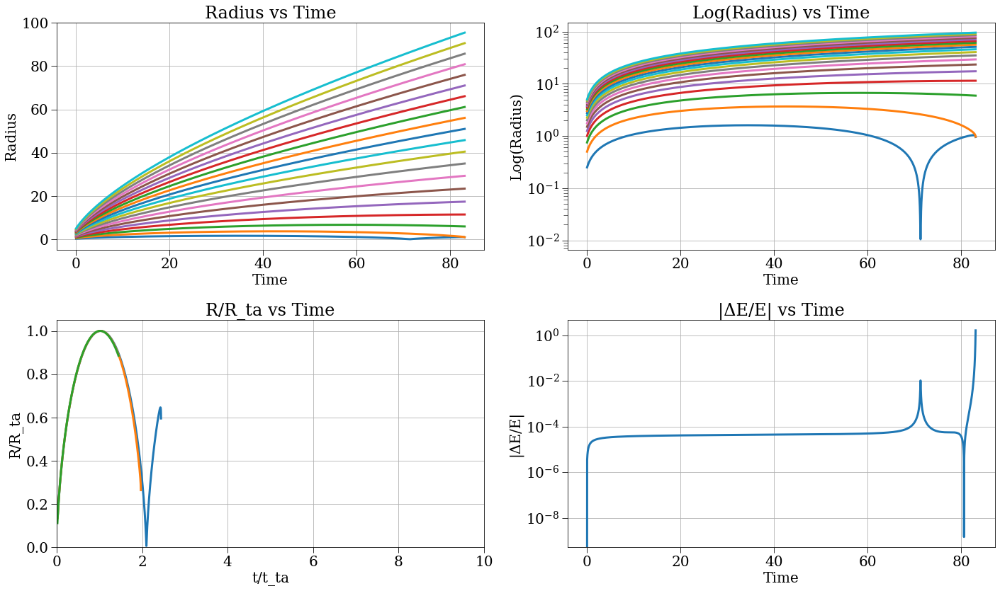

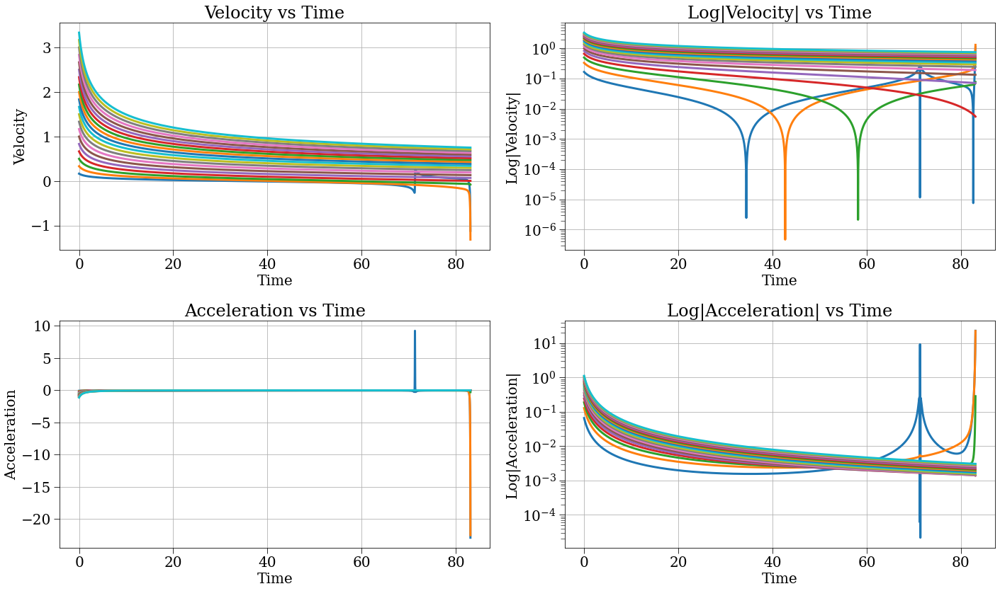

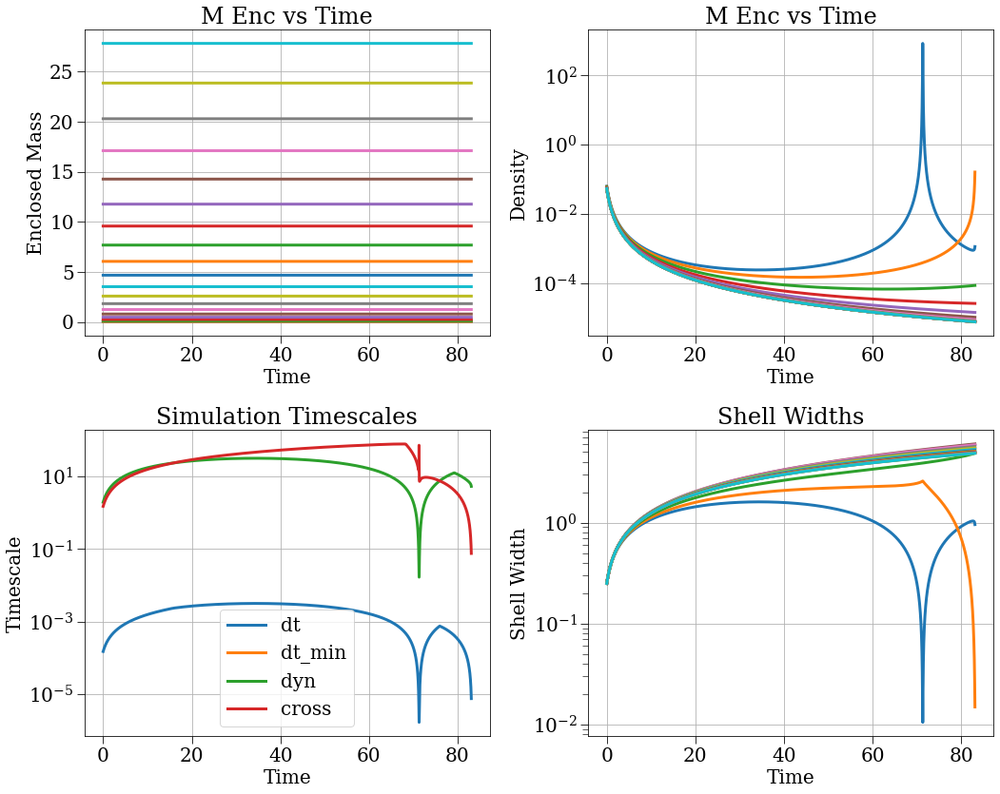

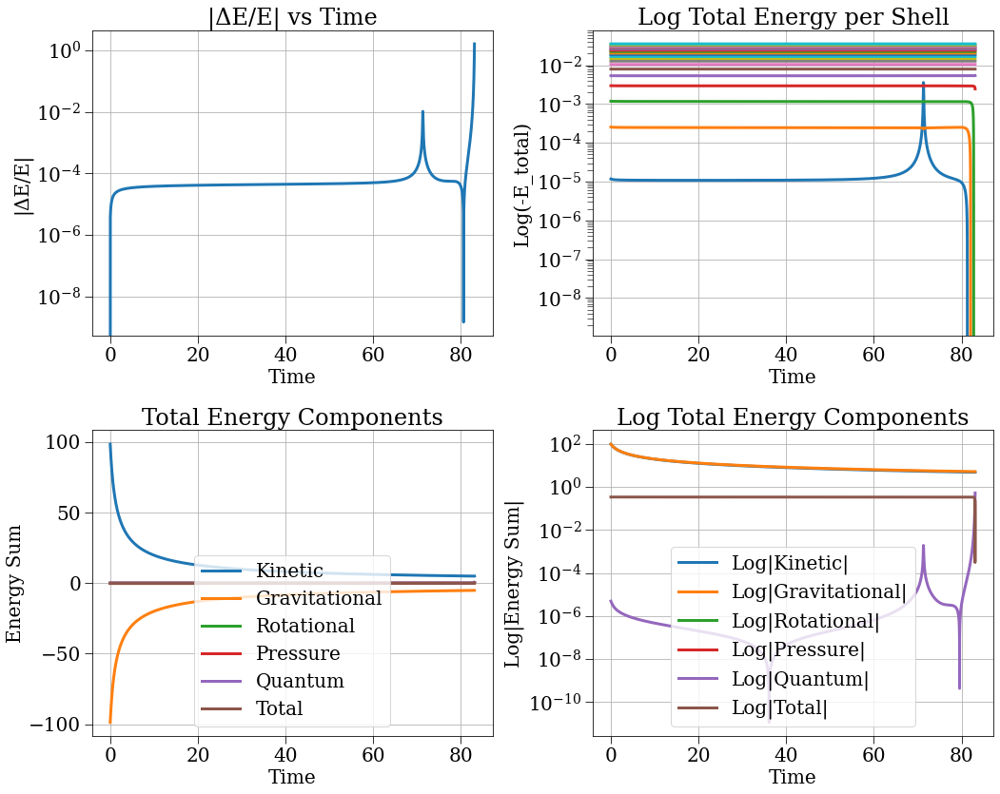

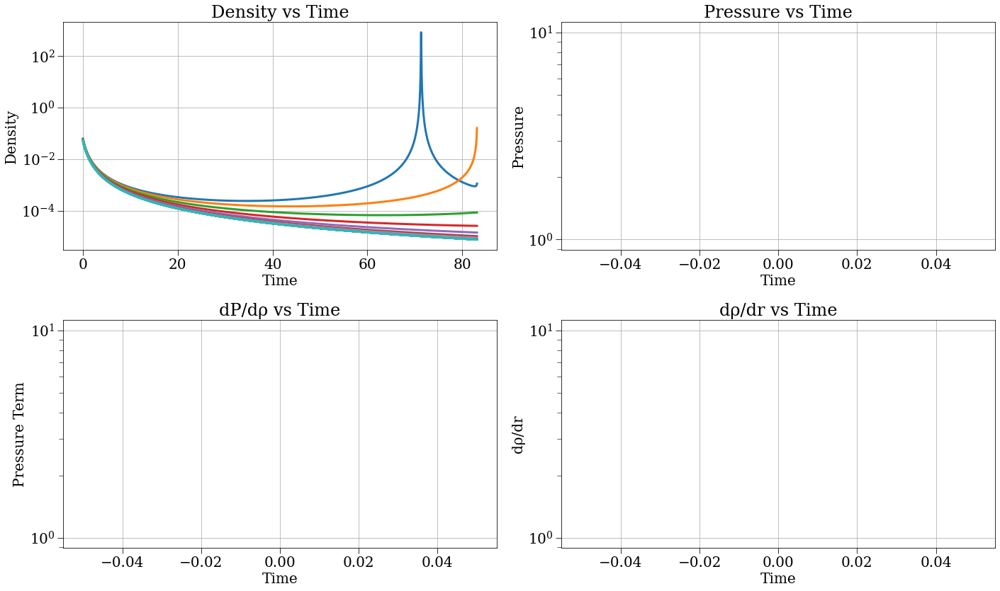

[0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5
 3.75 4.   4.25 4.5  4.75 5.  ]


In [28]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

In [6]:
t_max = 65.9
config_gauss = make_cycloid_config(N=200, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_cross', dt_min=0, safety_factor=1e-4, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='quantum_potential', delta_i=0.2, r_th=1, energy_strategy='quantum_potential', H=H0, save_dt=1e-4, stepper_strategy='beeman', j_coeff=0, density_strategy='background_plus_gaussian', hbar2_over_m2=1e-4)#irs='equal_mass')

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/utils.py:138: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, C))
  dy[i] = np.dot(w[:, m], ys)
2025-04-24 10:09:56,368 - collapse - INFO - Simulation setup complete


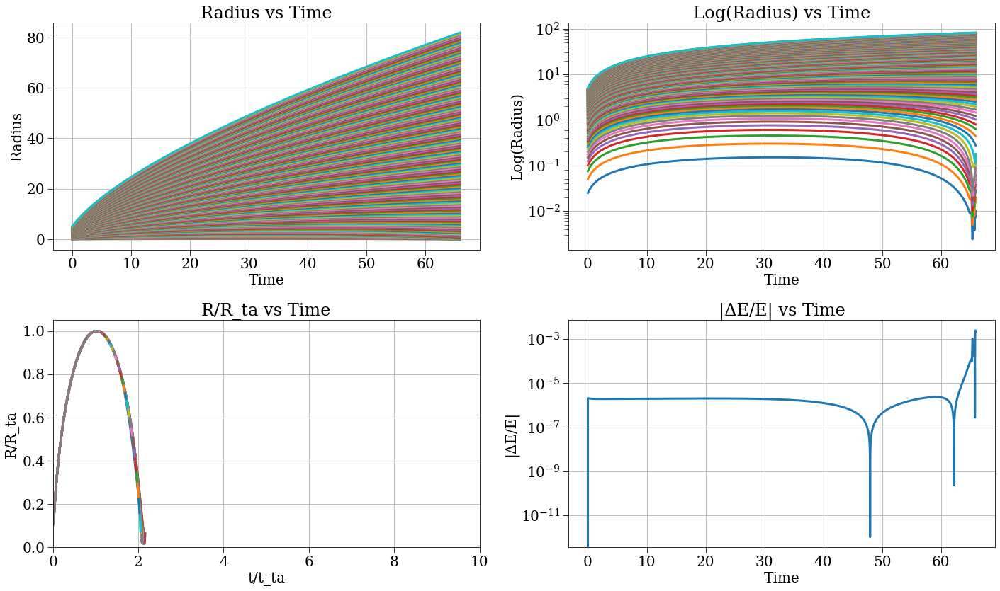

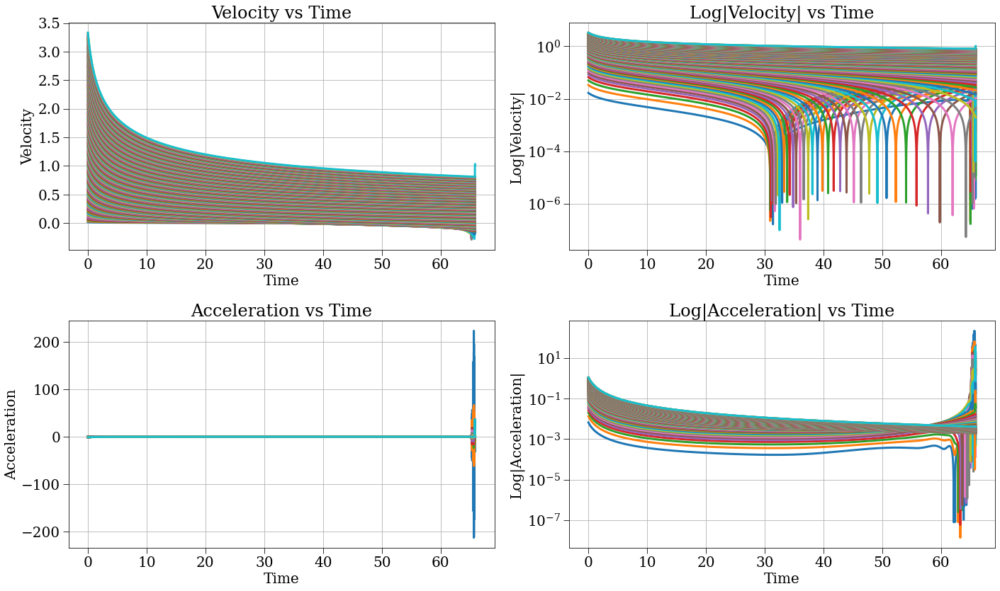

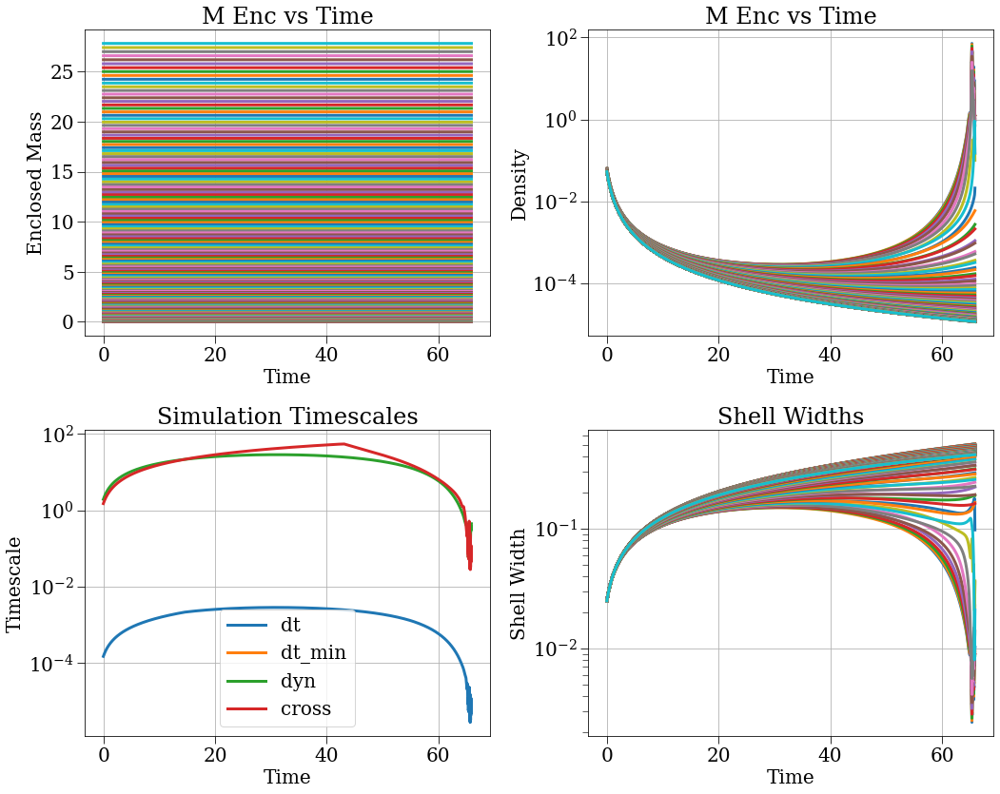

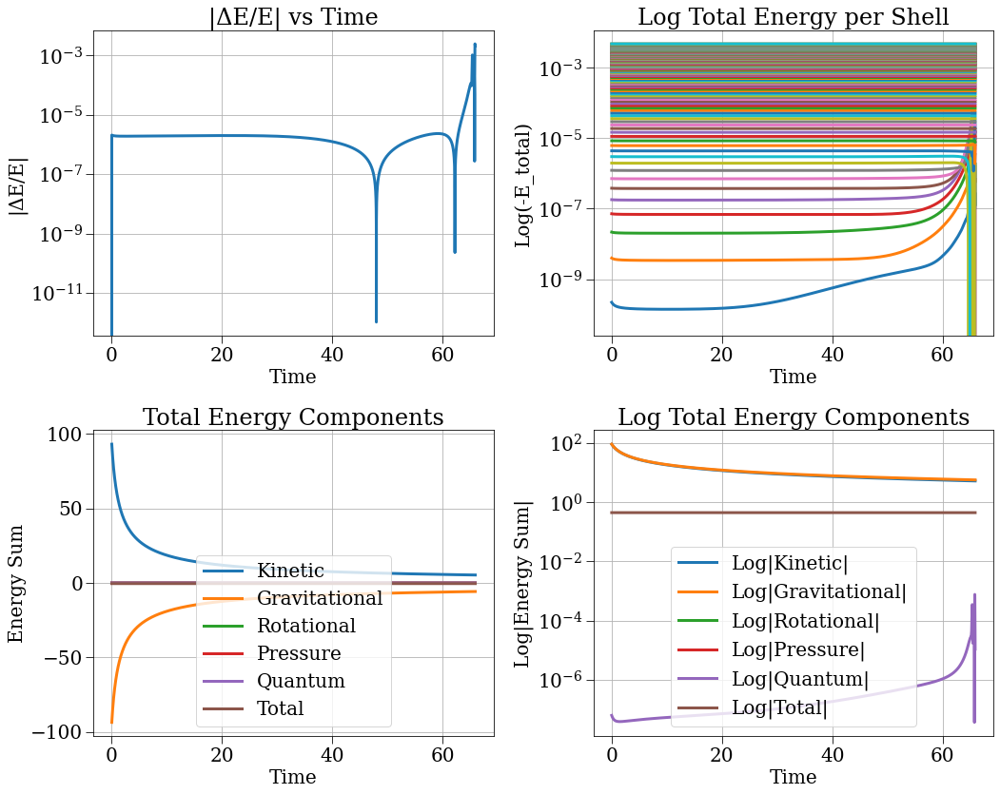

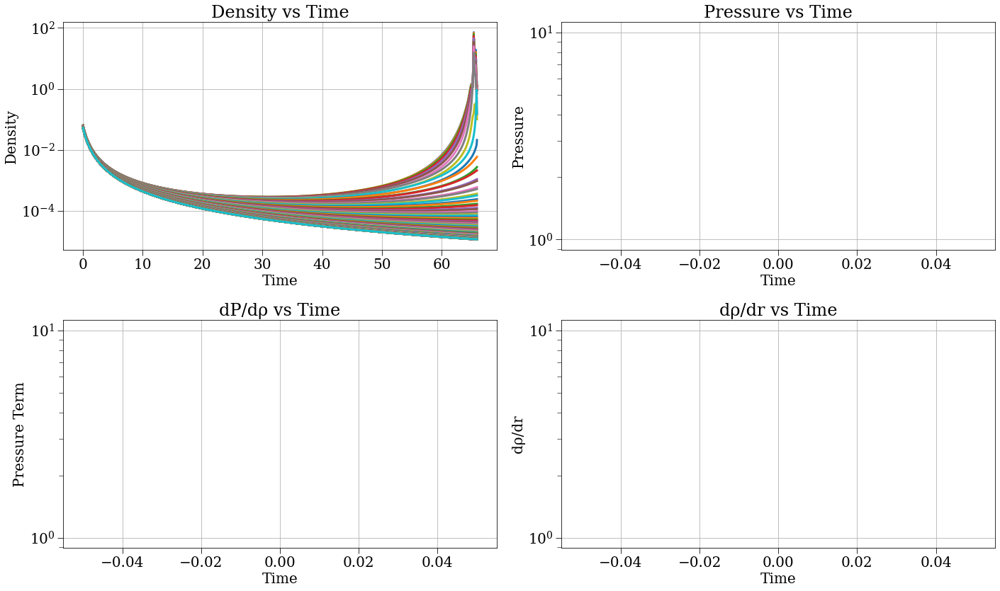

[0.025 0.05  0.075 0.1   0.125 0.15  0.175 0.2   0.225 0.25  0.275 0.3
 0.325 0.35  0.375 0.4   0.425 0.45  0.475 0.5   0.525 0.55  0.575 0.6
 0.625 0.65  0.675 0.7   0.725 0.75  0.775 0.8   0.825 0.85  0.875 0.9
 0.925 0.95  0.975 1.    1.025 1.05  1.075 1.1   1.125 1.15  1.175 1.2
 1.225 1.25  1.275 1.3   1.325 1.35  1.375 1.4   1.425 1.45  1.475 1.5
 1.525 1.55  1.575 1.6   1.625 1.65  1.675 1.7   1.725 1.75  1.775 1.8
 1.825 1.85  1.875 1.9   1.925 1.95  1.975 2.    2.025 2.05  2.075 2.1
 2.125 2.15  2.175 2.2   2.225 2.25  2.275 2.3   2.325 2.35  2.375 2.4
 2.425 2.45  2.475 2.5   2.525 2.55  2.575 2.6   2.625 2.65  2.675 2.7
 2.725 2.75  2.775 2.8   2.825 2.85  2.875 2.9   2.925 2.95  2.975 3.
 3.025 3.05  3.075 3.1   3.125 3.15  3.175 3.2   3.225 3.25  3.275 3.3
 3.325 3.35  3.375 3.4   3.425 3.45  3.475 3.5   3.525 3.55  3.575 3.6
 3.625 3.65  3.675 3.7   3.725 3.75  3.775 3.8   3.825 3.85  3.875 3.9
 3.925 3.95  3.975 4.    4.025 4.05  4.075 4.1   4.125 4.15  4.175 4.2
 4.225 

In [7]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

In [30]:
t_max = 62
config_gauss = make_cycloid_config(N=200, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=0, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-2, stepper_strategy='beeman', j_coeff=0, density_strategy='background_plus_gaussian',)#irs='equal_mass')

2025-04-24 01:47:33,931 - collapse - INFO - Simulation setup complete


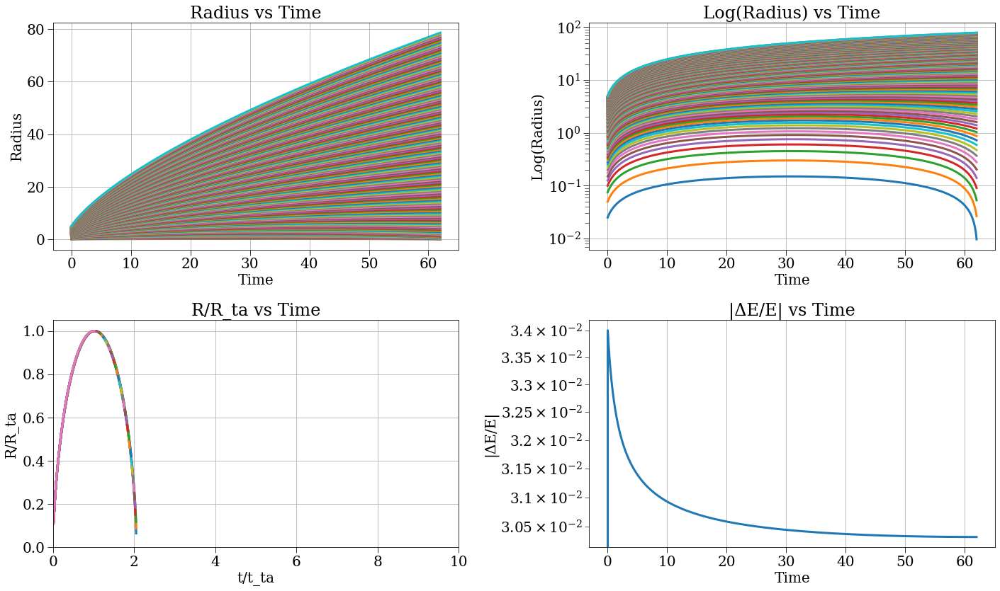

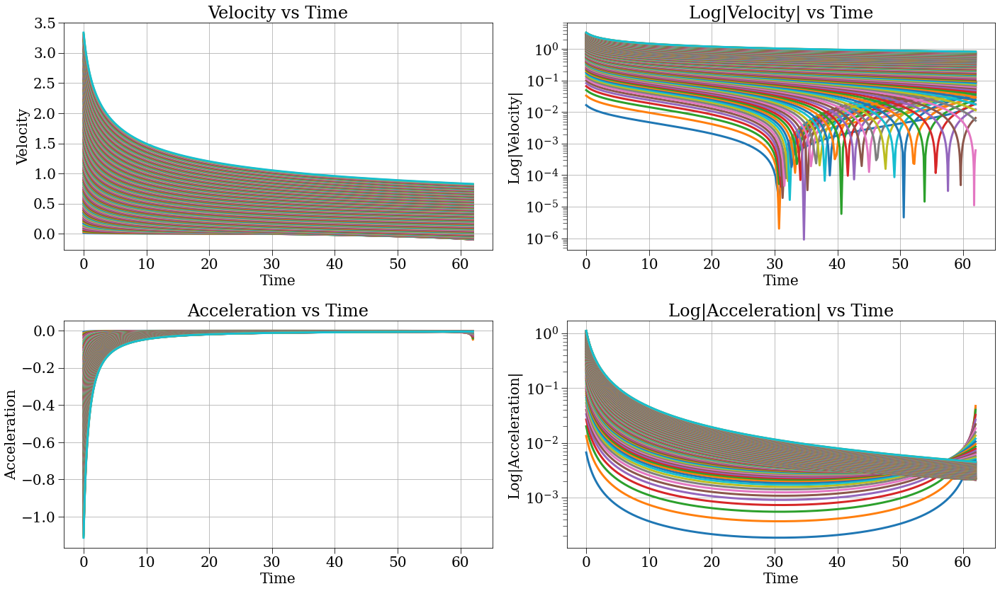

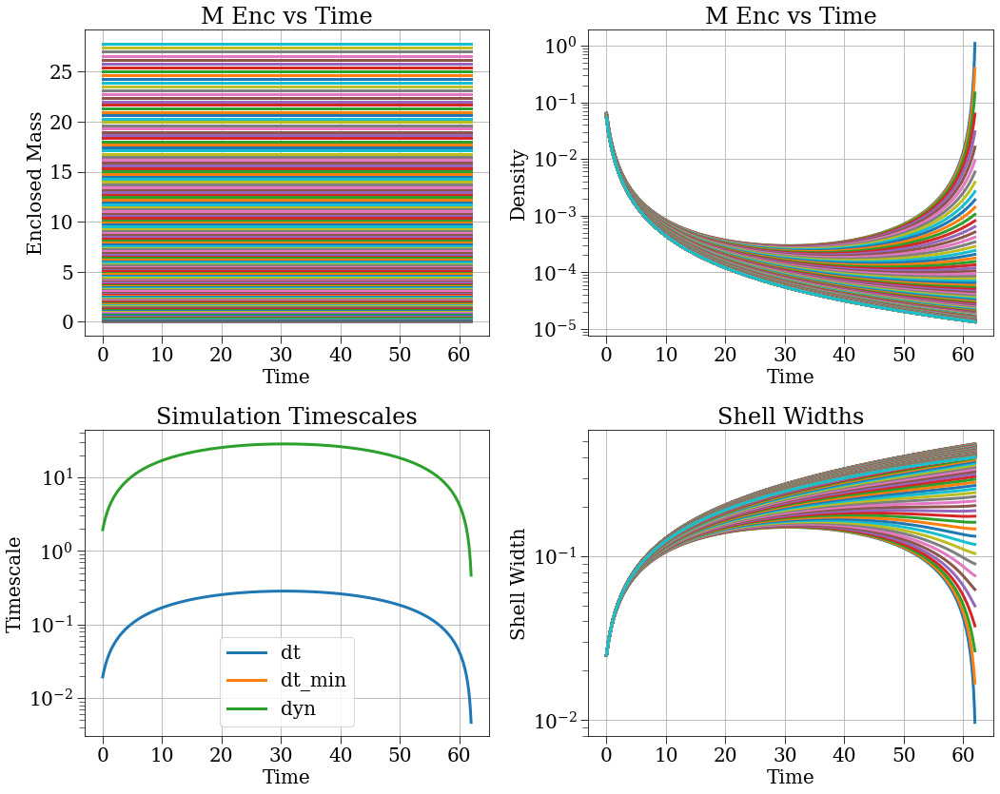

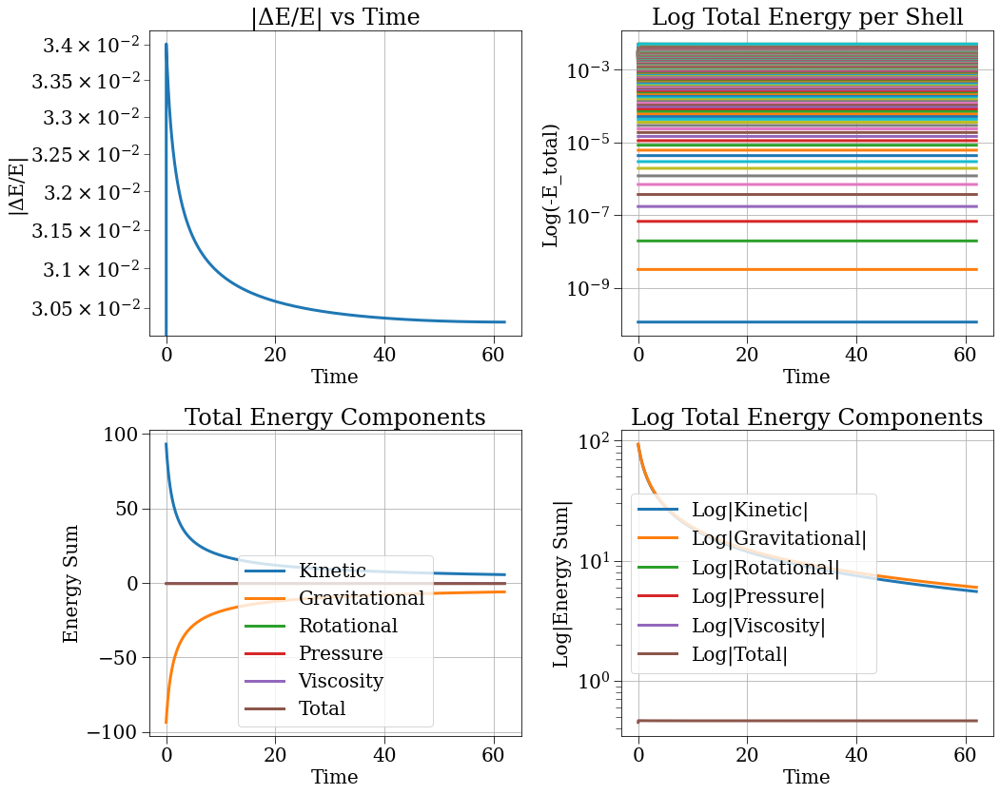

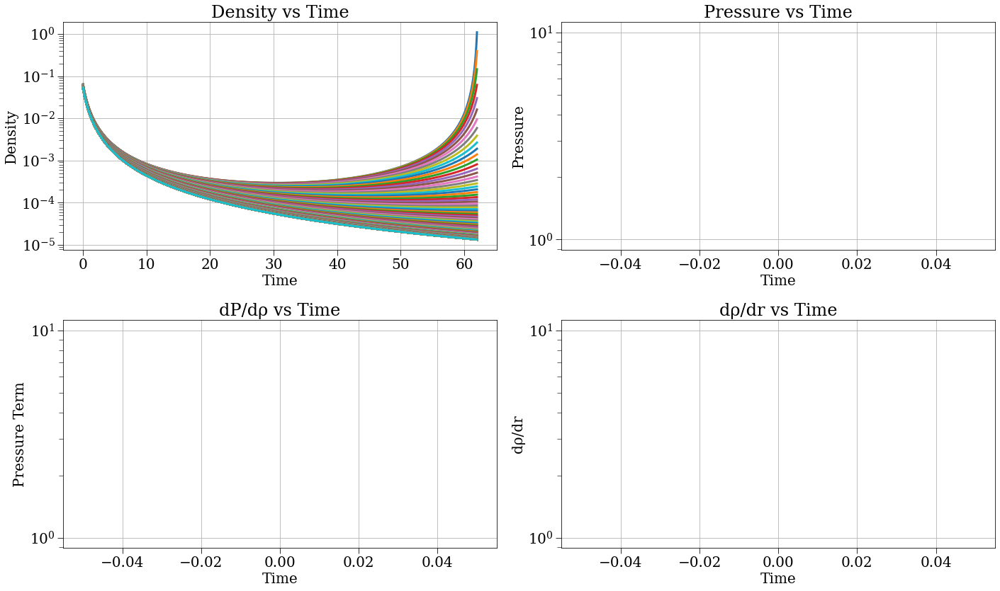

[0.025 0.05  0.075 0.1   0.125 0.15  0.175 0.2   0.225 0.25  0.275 0.3
 0.325 0.35  0.375 0.4   0.425 0.45  0.475 0.5   0.525 0.55  0.575 0.6
 0.625 0.65  0.675 0.7   0.725 0.75  0.775 0.8   0.825 0.85  0.875 0.9
 0.925 0.95  0.975 1.    1.025 1.05  1.075 1.1   1.125 1.15  1.175 1.2
 1.225 1.25  1.275 1.3   1.325 1.35  1.375 1.4   1.425 1.45  1.475 1.5
 1.525 1.55  1.575 1.6   1.625 1.65  1.675 1.7   1.725 1.75  1.775 1.8
 1.825 1.85  1.875 1.9   1.925 1.95  1.975 2.    2.025 2.05  2.075 2.1
 2.125 2.15  2.175 2.2   2.225 2.25  2.275 2.3   2.325 2.35  2.375 2.4
 2.425 2.45  2.475 2.5   2.525 2.55  2.575 2.6   2.625 2.65  2.675 2.7
 2.725 2.75  2.775 2.8   2.825 2.85  2.875 2.9   2.925 2.95  2.975 3.
 3.025 3.05  3.075 3.1   3.125 3.15  3.175 3.2   3.225 3.25  3.275 3.3
 3.325 3.35  3.375 3.4   3.425 3.45  3.475 3.5   3.525 3.55  3.575 3.6
 3.625 3.65  3.675 3.7   3.725 3.75  3.775 3.8   3.825 3.85  3.875 3.9
 3.925 3.95  3.975 4.    4.025 4.05  4.075 4.1   4.125 4.15  4.175 4.2
 4.225 

In [31]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

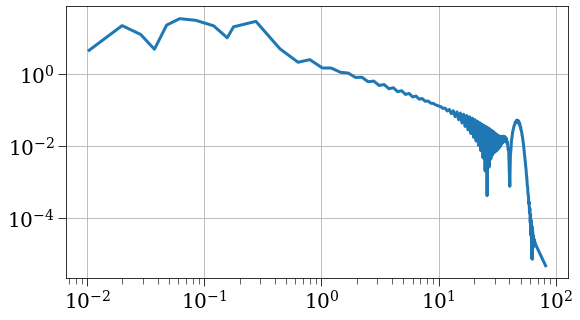

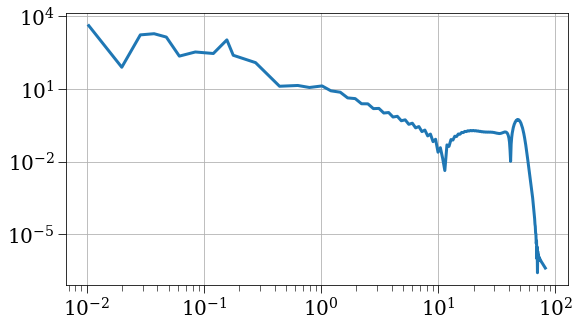

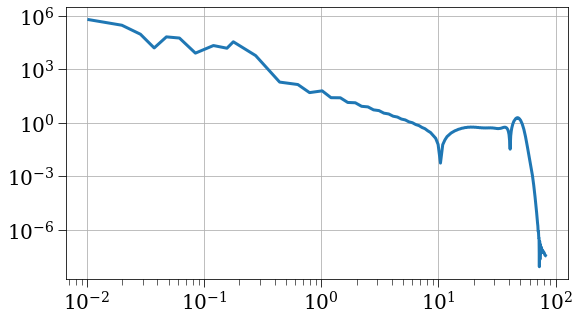

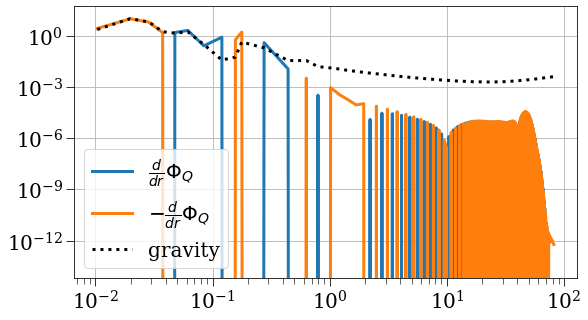

In [14]:
r_fin = r['r'][-1,:]
rho_fin = r['rho_r'][-1,:]
a_fin = r['a'][-1,:]
t_fin = r['t'][-1]
rho_H_fin = rho_H / t_fin**2

lnrho_fin = np.log(rho_fin)
d1 = derivative_nonuniform(r_fin, lnrho_fin)
d2 = derivative_nonuniform(r_fin, lnrho_fin, 2)
d3 = derivative_nonuniform(r_fin, lnrho_fin, 3)
aq = 1e-4 * quantum_acc_from_potential(r_fin, rho_fin)

plt.loglog(r_fin, np.abs(d1), label=r'$\frac{d}{dr} \ln \rho$')
plt.figure()
plt.loglog(r_fin, np.abs(d2), label=r'$\frac{d^2}{dr^2} \ln \rho$')
plt.figure()
plt.loglog(r_fin, np.abs(d3), label=r'$\frac{d^3}{dr^3} \ln \rho$')
plt.figure()
plt.loglog(r_fin, aq, label=r'$\frac{d}{dr} \Phi_Q$')
plt.loglog(r_fin, -aq, label=r'$-\frac{d}{dr} \Phi_Q$')
plt.loglog(r_fin, np.abs(a_fin), label='gravity', ls=':', color='k')
plt.legend()

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/utils.py:138: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, C))
  dy[i] = np.dot(w[:, m], ys)
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/utils.py:138: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, C))
  dy[i] = np.dot(w[:, m], ys)


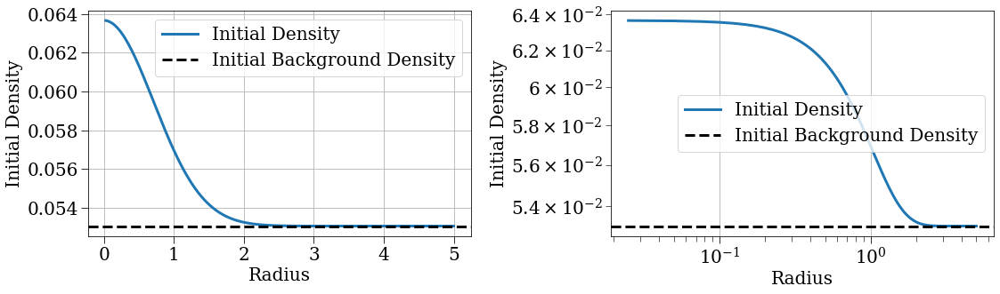

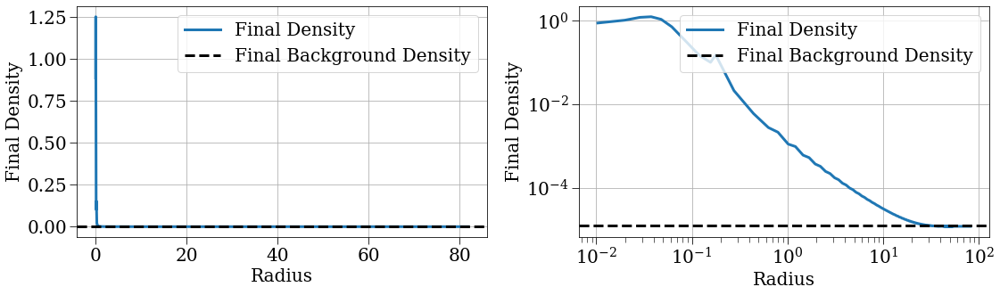

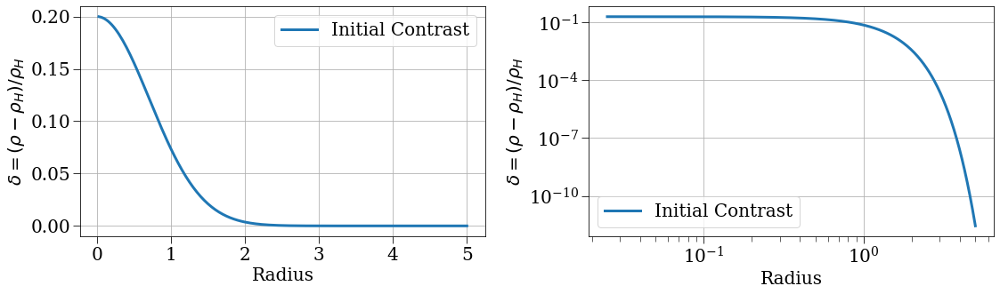

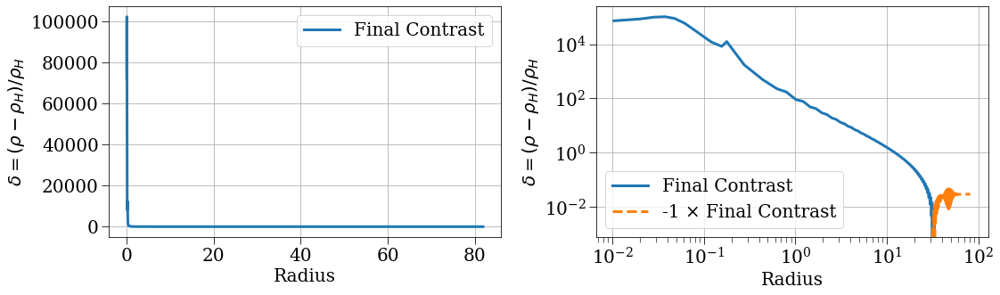

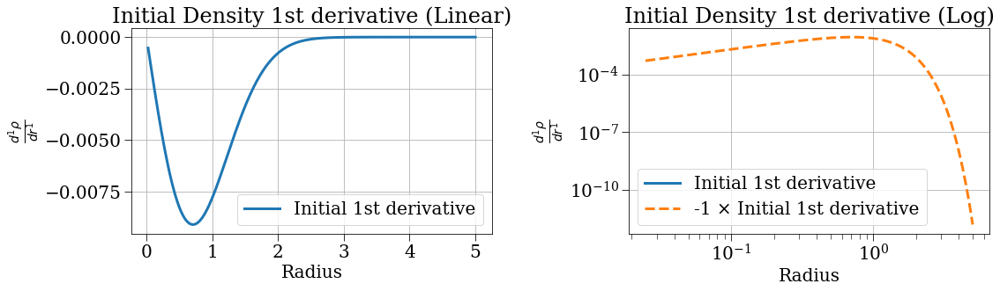

...

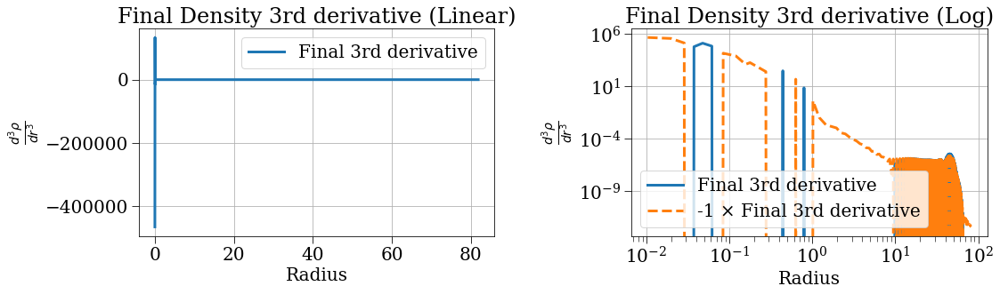

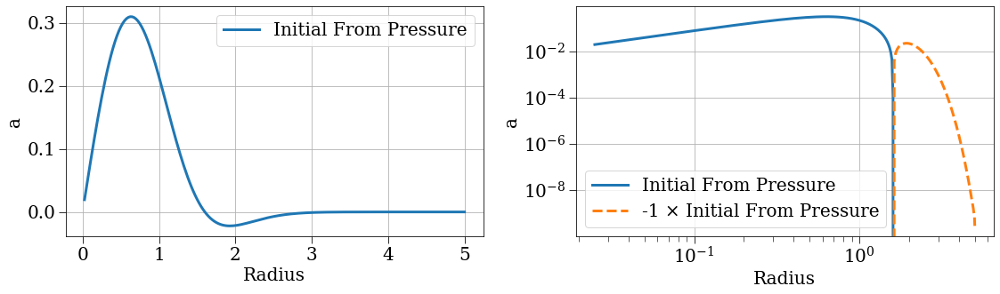

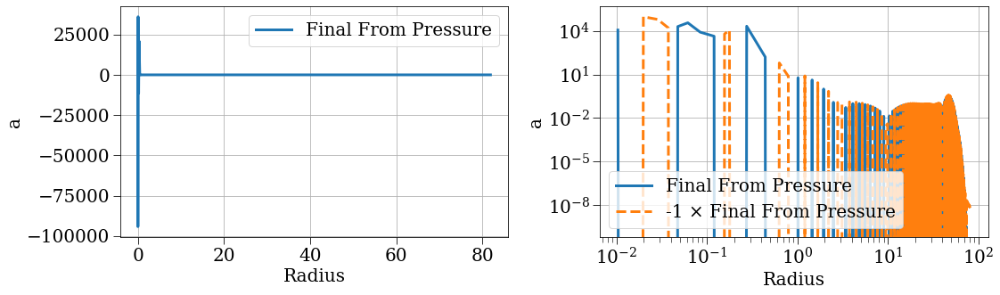

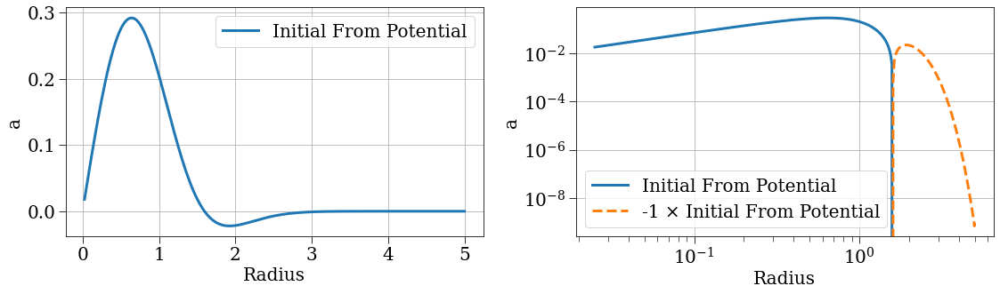

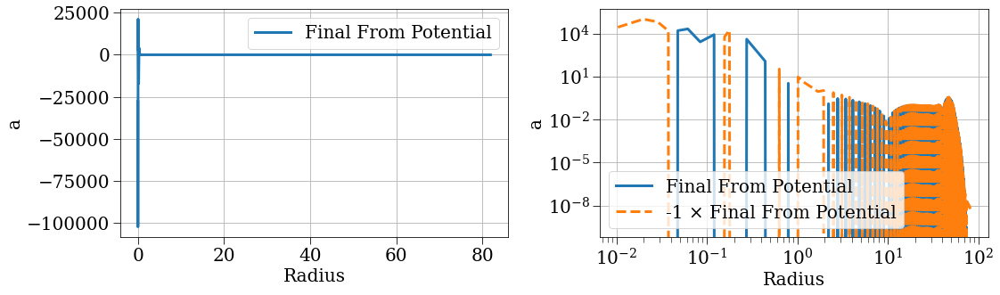

In [9]:
# With custom functions
custom_funcs = [
    # {
    #     'function': quantum_acc_from_pressure,
    #     'name': 'From Pressure',
    #     'ylabel': r'a'
    # },
    {
        'function': quantum_acc_from_potential,
        'name': 'From Potential',
        'ylabel': r'a'
    },
    {
        'function': quantum_acc_from_potential,
        'name': 'From Potential',
        'ylabel': r'a'
    },
    
]
analyze_density_results(r, custom_funcs)

In [8]:
def plot_density_function(r_vals, func_vals, func_name, background_val=None, background_label=None, figsize=(16, 5), 
                         negative_in_log=False, custom_ylabel=None, custom_title=None, xlim=None, ylim=None):
    """
    Create standardized plots for any function of radius with both linear and log scales.
    
    Parameters:
    - r_vals: radius values (x-axis)
    - func_vals: function values (y-axis)
    - func_name: name of the function (used in labels)
    - background_val: optional background value to show as horizontal line
    - background_label: label for the background line
    - figsize: figure size tuple
    - negative_in_log: if True, plot both positive and negative values in log plot
    - custom_ylabel: override the default y-axis label
    - custom_title: override the default title
    - xlim, ylim: axis limits (can be None)
    
    Returns:
    - fig: the figure object
    - axs: the axes array
    """
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    
    # Linear scale plot
    axs[0].plot(r_vals, func_vals, label=func_name)
    if background_val is not None:
        axs[0].axhline(background_val, color='k', linestyle='--', label=background_label)
    
    axs[0].set_xlabel('Radius')
    axs[0].set_ylabel(custom_ylabel if custom_ylabel else func_name)
    if custom_title:
        axs[0].set_title(f"{custom_title} (Linear)")
    if xlim:
        axs[0].set_xlim(xlim)
    if ylim:
        axs[0].set_ylim(ylim)
    axs[0].legend()
    
    # Log scale plot
    axs[1].plot(r_vals, func_vals, label=func_name)
    if background_val is not None:
        axs[1].axhline(background_val, color='k', linestyle='--', label=background_label)
    
    if np.any(func_vals < 0):
        axs[1].plot(r_vals, -func_vals, label=f"-1 × {func_name}", linestyle='--')
    
    axs[1].set_xlabel('Radius')
    axs[1].set_ylabel(custom_ylabel if custom_ylabel else func_name)
    if custom_title:
        axs[1].set_title(f"{custom_title} (Log)")
    axs[1].set_yscale('log')
    axs[1].set_xscale('log')
    if xlim:
        axs[1].set_xlim(xlim)
    axs[1].legend()
    
    plt.tight_layout()
    return fig, axs

def compute_derivatives(r_vals, func_vals, max_order=3):
    """
    Compute derivatives of a function with respect to radius.
    
    Parameters:
    - r_vals: radius values (x-axis)
    - func_vals: function values to differentiate
    - max_order: maximum order of derivatives to compute
    
    Returns:
    - dict: Dictionary of derivatives up to max_order
    """
    derivatives = {}
    derivatives[0] = func_vals  # The function itself (0th derivative)
    
    current_derivative = func_vals
    for i in range(1, max_order + 1):
        # Use numpy's gradient to compute derivatives
        derivative = derivative_nonuniform(r_vals, current_derivative, m=1)
        derivatives[i] = derivative
        current_derivative = derivative
        
    return derivatives

def plot_density_analysis(r_initial, rho_initial, r_final, rho_final, rho_H_initial, rho_H_final, 
                         plot_derivatives=True, max_derivative_order=3):
    """
    Create a comprehensive set of density analysis plots.
    
    Parameters:
    - r_initial, rho_initial: Initial radius and density arrays
    - r_final, rho_final: Final radius and density arrays
    - rho_H_initial, rho_H_final: Background densities (initial and final)
    - plot_derivatives: Whether to plot density derivatives
    - max_derivative_order: Maximum order of derivatives to plot
    """
    # 1. Plot densities
    plot_density_function(r_initial, rho_initial, "Initial Density", 
                         background_val=rho_H_initial, background_label="Initial Background Density")
    
    plot_density_function(r_final, rho_final, "Final Density", 
                         background_val=rho_H_final, background_label="Final Background Density")
    
    # 2. Plot density contrasts
    delta_initial = (rho_initial - rho_H_initial) / rho_H_initial
    delta_final = (rho_final - rho_H_final) / rho_H_final
    
    plot_density_function(r_initial, delta_initial, "Initial Contrast", 
                         negative_in_log=True, custom_ylabel=r'$\delta=(\rho-\rho_H)/\rho_H$')
    
    plot_density_function(r_final, delta_final, "Final Contrast", 
                         negative_in_log=True, custom_ylabel=r'$\delta=(\rho-\rho_H)/\rho_H$')
    
    # 3. Compute and plot derivatives if requested
    if plot_derivatives:
        # Compute derivatives
        initial_derivatives = compute_derivatives(r_initial, rho_initial, max_derivative_order)
        final_derivatives = compute_derivatives(r_final, rho_final, max_derivative_order)
        
        # Plot each derivative
        for order in range(1, max_derivative_order + 1):
            deriv_name = f"{order}{['st', 'nd', 'rd'][order-1] if order <= 3 else 'th'} derivative"
            
            # Initial derivative
            plot_density_function(
                r_initial, 
                initial_derivatives[order], 
                f"Initial {deriv_name}",
                negative_in_log=True,
                custom_ylabel=f"$\\frac{{d^{order}\\rho}}{{dr^{order}}}$",
                custom_title=f"Initial Density {deriv_name}"
            )
            
            # Final derivative
            plot_density_function(
                r_final, 
                final_derivatives[order], 
                f"Final {deriv_name}",
                negative_in_log=True,
                custom_ylabel=f"$\\frac{{d^{order}\\rho}}{{dr^{order}}}$",
                custom_title=f"Final Density {deriv_name}"
            )

# Usage example:
def analyze_density_results(results, custom_functions=None):
    """
    Analyze density results from simulation and generate standard plots.
    
    Parameters:
    - results: The simulation results dictionary
    - custom_functions: Optional list of custom analysis functions to apply to density
    """
    r0 = results['r'][0,:]
    rho0 = results['rho_r'][0,:]
    r_fin = results['r'][-1,:]
    rho_fin = results['rho_r'][-1,:]
    t_fin = results['t'][-1]
    rho_H_fin = rho_H / t_fin**2
    
    # Generate standard plots
    plot_density_analysis(r0, rho0, r_fin, rho_fin, rho_H, rho_H_fin)
    
    # If custom functions provided, generate those plots too
    if custom_functions:
        for func_info in custom_functions:
            func = func_info['function']
            name = func_info['name']
            
            # Apply function to initial and final densities
            initial_result = func(r0, rho0)
            final_result = func(r_fin, rho_fin)
            
            # Plot results
            plot_density_function(r0, initial_result, f"Initial {name}", 
                                 custom_ylabel=func_info.get('ylabel', name))
            plot_density_function(r_fin, final_result, f"Final {name}", 
                                 custom_ylabel=func_info.get('ylabel', name))

# Example of adding a custom analysis function
def density_laplacian(r, rho):
    drho_dr = derivative_nonuniform(r, rho, m=1)
    d2rho_dr2 = derivative_nonuniform(r, rho, m=2)
    return d2rho_dr2 + 2/r * drho_dr

def log_density_laplacian(r, rho):
    logrho = np.log(rho)
    dlogrho_dr = derivative_nonuniform(r, logrho)
    d2logrho_dr2 = derivative_nonuniform(r, logrho, 2)
    return d2logrho_dr2 + 2/r * dlogrho_dr

def sqrt_density_laplacian(r, rho):
    sqrt_rho = np.sqrt(rho)
    dsqrt_rho_dr = derivative_nonuniform(r, sqrt_rho)
    d2sqrt_rho_dr2 = derivative_nonuniform(r, sqrt_rho, 2)
    return d2sqrt_rho_dr2 + 2/r * dsqrt_rho_dr

def quantum_potential(r, rho):
    sqrt_laplacian = sqrt_density_laplacian(r, rho)
    return sqrt_laplacian / np.sqrt(rho)

def quantum_pressure(r, rho):
    log_laplacian = log_density_laplacian(r, rho)
    return -rho/4 * log_laplacian

def quantum_acc_from_pressure(r, rho):
    qp = quantum_pressure(r, rho)
    dqp_dr = derivative_nonuniform(r, qp)
    return -dqp_dr / rho

def quantum_acc_from_potential(r, rho):
    qp = quantum_potential(r, rho)
    dqp_dr = derivative_nonuniform(r, qp)
    return dqp_dr / 2

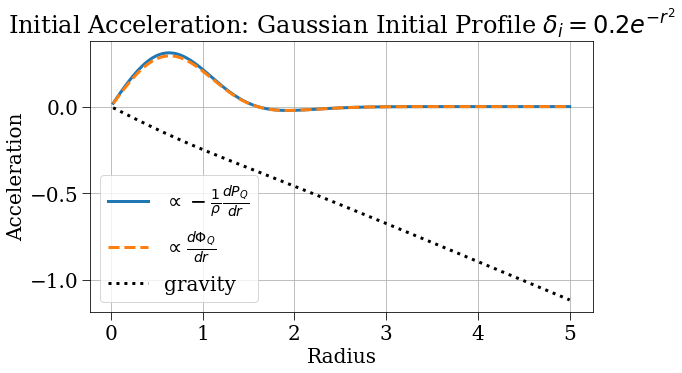

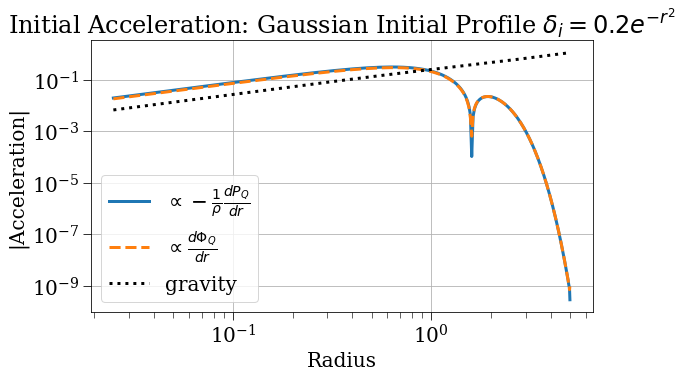

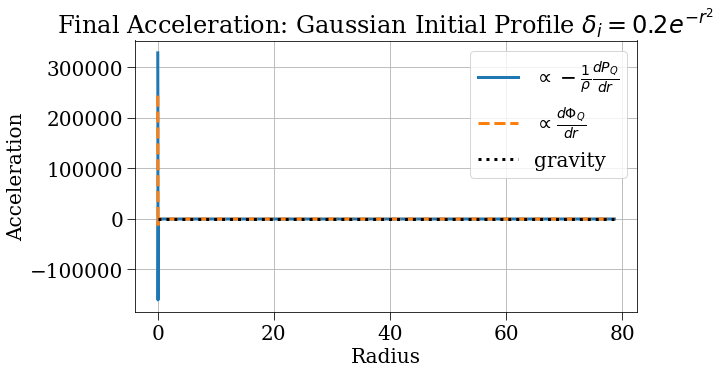

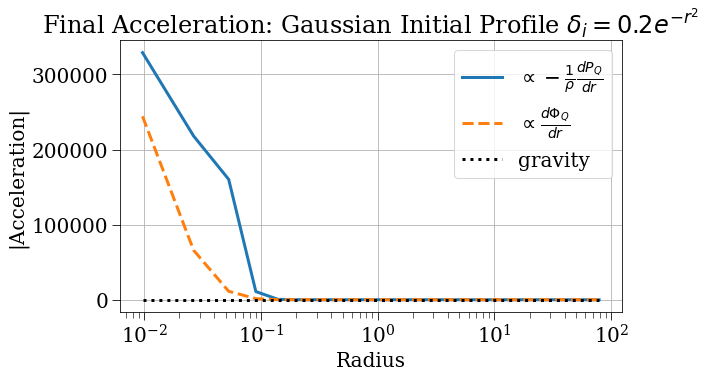

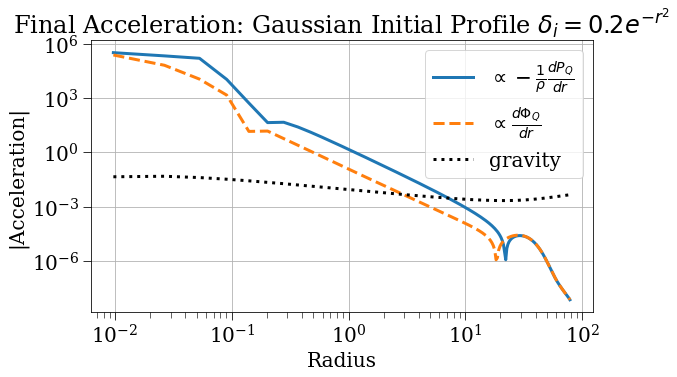

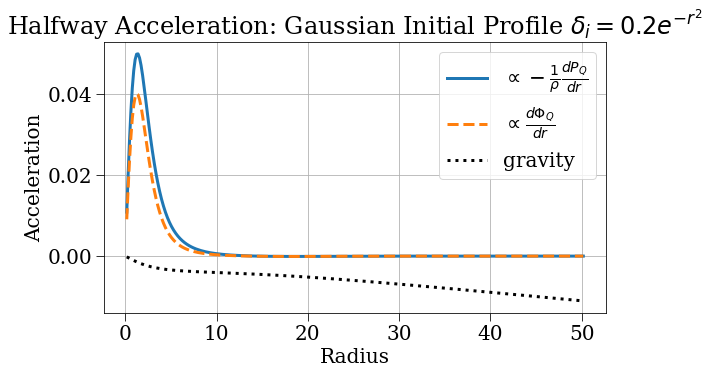

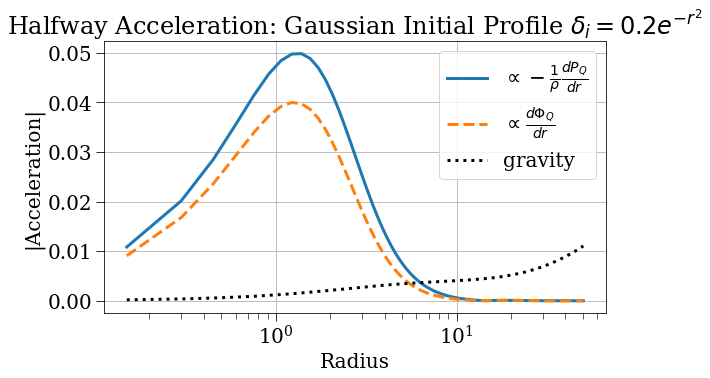

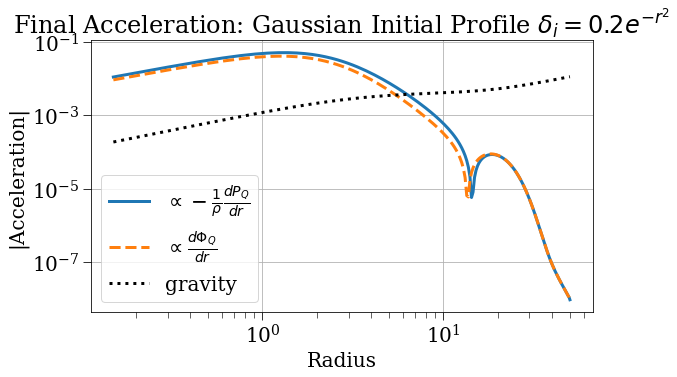

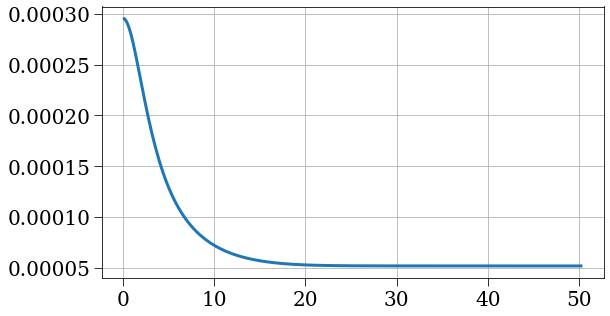

In [23]:
r0 = r['r'][0,:]
rho0 = r['rho_r'][0,:]
a0 = r['a'][0,:]
r_fin = r['r'][-1,:]
rho_fin = r['rho_r'][-1,:]
a_fin = r['a'][-1,:]
t_fin = r['t'][-1]
rho_H_fin = rho_H / t_fin**2

r_half = r['r'][np.argmin(np.abs(r['t'] - 31)),:]
rho_half = r['rho_r'][np.argmin(np.abs(r['t'] - 31)),:]
a_half = r['a'][np.argmin(np.abs(r['t'] - 31)),:]
t_half = r['t'][np.argmin(np.abs(r['t'] - 31))]
rho_H_half = rho_H / t_half**2

figsize = (16, 5)

plt.plot(r0, quantum_acc_from_pressure(r0, rho0), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r0, quantum_acc_from_potential(r0, rho0), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r0, a0, label='gravity', ls=':', color='k')
plt.legend()
plt.title(r'Initial Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.xlabel('Radius')
plt.ylabel('Acceleration')
plt.figure()
plt.plot(r0, np.abs(quantum_acc_from_pressure(r0, rho0)), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r0, np.abs(quantum_acc_from_potential(r0, rho0)), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r0, np.abs(a0), label='gravity', ls=':', color='k')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Radius')
plt.ylabel('|Acceleration|')
plt.legend()
plt.title(r'Initial Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.figure()

plt.plot(r_fin, quantum_acc_from_pressure(r_fin, rho_fin), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, quantum_acc_from_potential(r_fin, rho_fin), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, a_fin, label='gravity', ls=':', color='k')
plt.legend()
plt.title(r'Final Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.xlabel('Radius')
plt.ylabel('Acceleration')
plt.figure()
plt.plot(r_fin, np.abs(quantum_acc_from_pressure(r_fin, rho_fin)), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, np.abs(quantum_acc_from_potential(r_fin, rho_fin)), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, np.abs(a_fin), label='gravity', ls=':', color='k')
#plt.yscale('log')
plt.xscale('log')
plt.xlabel('Radius')
plt.ylabel('|Acceleration|')
plt.legend()
plt.title(r'Final Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.figure()
plt.plot(r_fin, np.abs(quantum_acc_from_pressure(r_fin, rho_fin)), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, np.abs(quantum_acc_from_potential(r_fin, rho_fin)), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, np.abs(a_fin), label='gravity', ls=':', color='k')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Radius')
plt.ylabel('|Acceleration|')
plt.legend()
plt.title(r'Final Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.figure()

r_fin = r_half
rho_fin = rho_half
a_fin = a_half
t_fin = t_half
rho_H_fin = rho_H_half
plt.plot(r_fin, quantum_acc_from_pressure(r_fin, rho_fin), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, quantum_acc_from_potential(r_fin, rho_fin), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, a_fin, label='gravity', ls=':', color='k')
plt.legend()
plt.title(r'Halfway Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.xlabel('Radius')
plt.ylabel('Acceleration')
plt.figure()
plt.plot(r_fin, np.abs(quantum_acc_from_pressure(r_fin, rho_fin)), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, np.abs(quantum_acc_from_potential(r_fin, rho_fin)), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, np.abs(a_fin), label='gravity', ls=':', color='k')
#plt.yscale('log')
plt.xscale('log')
plt.xlabel('Radius')
plt.ylabel('|Acceleration|')
plt.legend()
plt.title(r'Halfway Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.figure()
plt.plot(r_fin, np.abs(quantum_acc_from_pressure(r_fin, rho_fin)), label=r'$\propto -\frac{1}{\rho} \frac{dP_Q}{dr}$')
plt.plot(r_fin, np.abs(quantum_acc_from_potential(r_fin, rho_fin)), ls='--', label=r'$\propto \frac{d\Phi_Q}{dr}$')
plt.plot(r_fin, np.abs(a_fin), label='gravity', ls=':', color='k')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Radius')
plt.ylabel('|Acceleration|')
plt.legend()
plt.title(r'Final Acceleration: Gaussian Initial Profile $\delta_i = 0.2 e^{-r^2}$')
plt.figure()
plt.plot(r_half, rho_half)

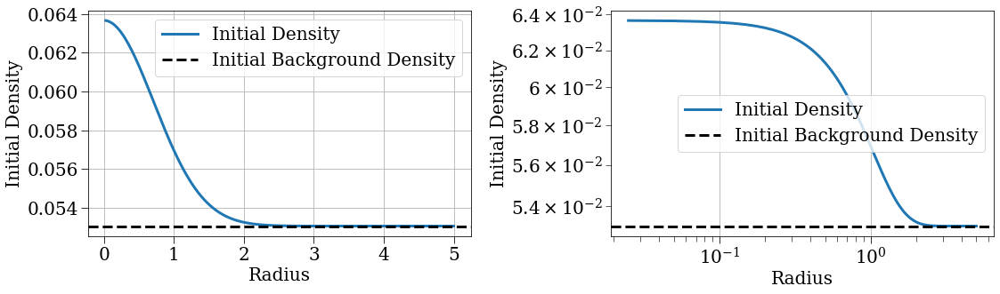

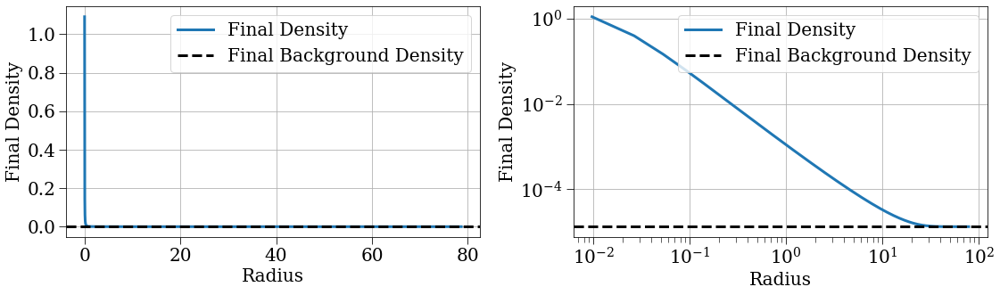

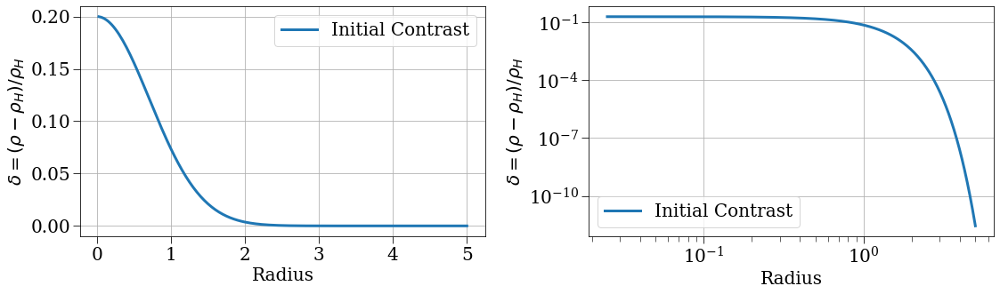

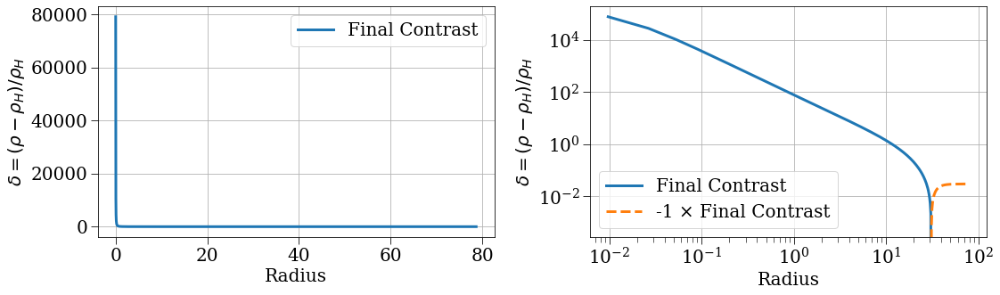

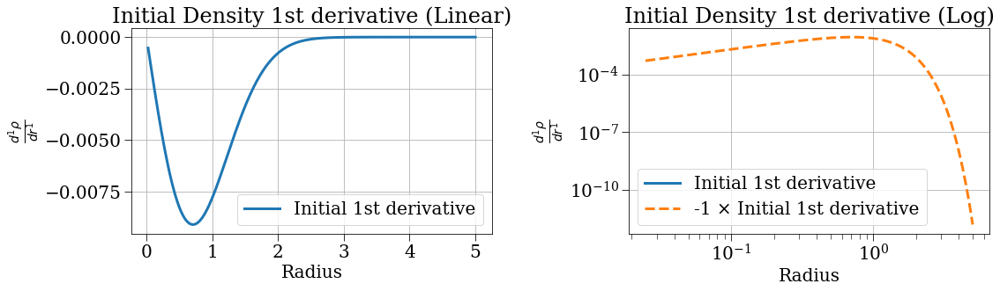

...

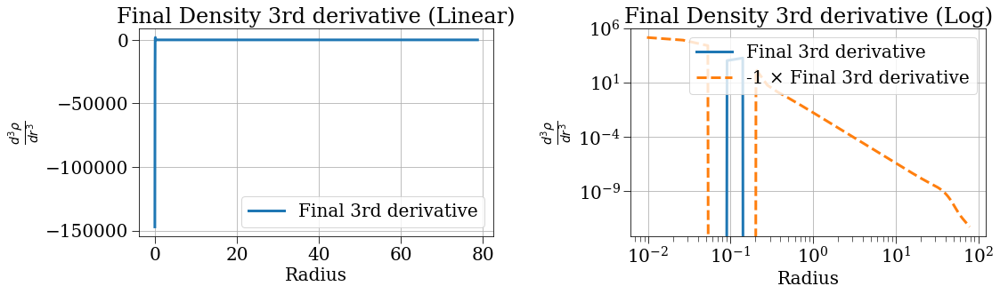

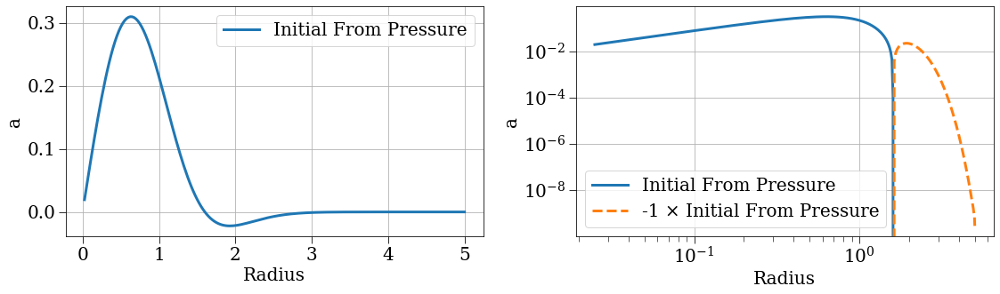

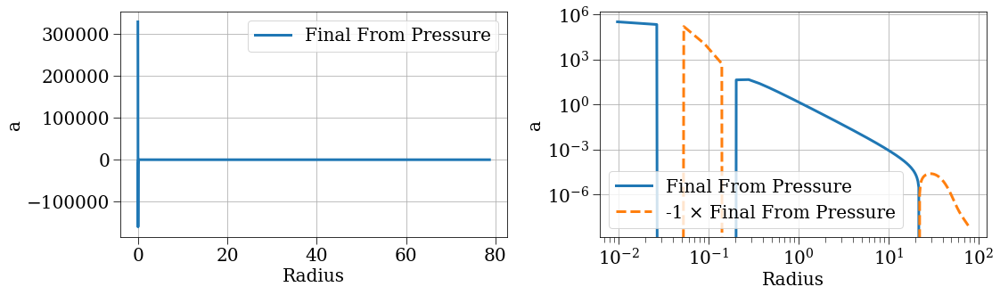

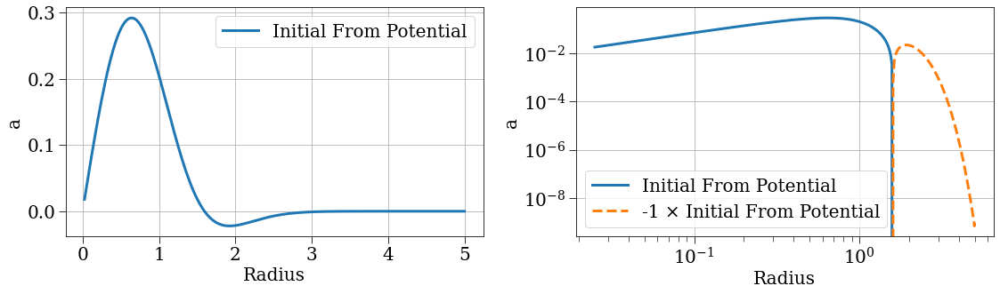

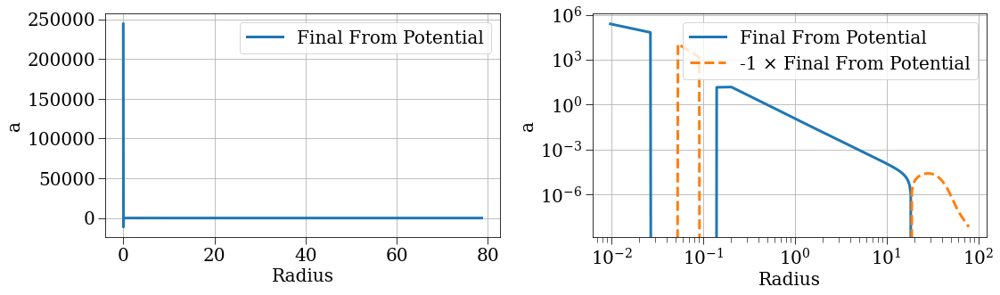

In [17]:
# With custom functions
custom_funcs = [
    {
        'function': quantum_acc_from_pressure,
        'name': 'From Pressure',
        'ylabel': r'a'
    },
    {
        'function': quantum_acc_from_potential,
        'name': 'From Potential',
        'ylabel': r'a'
    },
    # Add more custom functions as needed
]
analyze_density_results(r, custom_funcs)

In [49]:
x = [0, 1, 4, 9, 16, 25, 36, 49, 64, 81, 100]
print(np.gradient(x))
print(np.diff(x) / np.diff(np.arange(len(x))))


[ 1.  2.  4.  6.  8. 10. 12. 14. 16. 18. 19.]
[ 1.  3.  5.  7.  9. 11. 13. 15. 17. 19.]


ValueError: x and y must have same first dimension, but have shapes (200,) and (2000,)

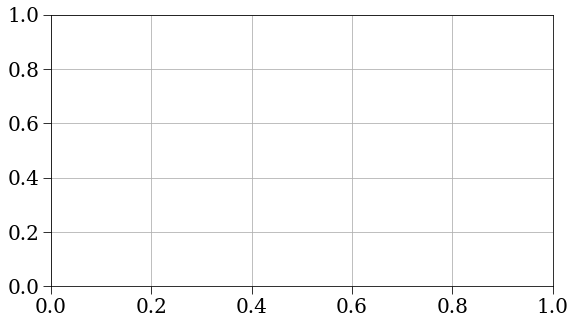

In [50]:
plt.plot(r0, lnrho0)

In [30]:
d3lnrho0_dr3[:5]

array([-3.33285592e+01, -3.33254344e+01, -1.66538639e+01,  1.66644759e-02,
        2.08292795e-02])

<Figure size 648x360 with 0 Axes>

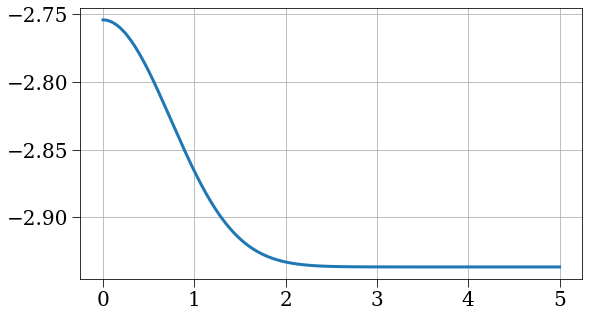

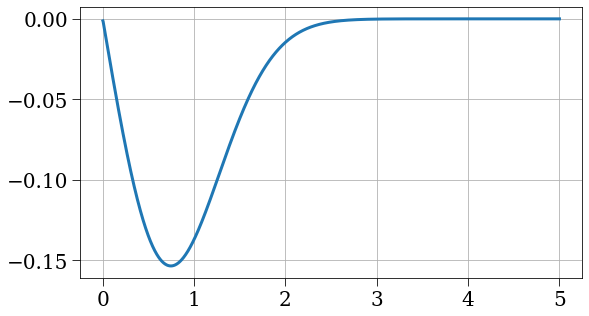

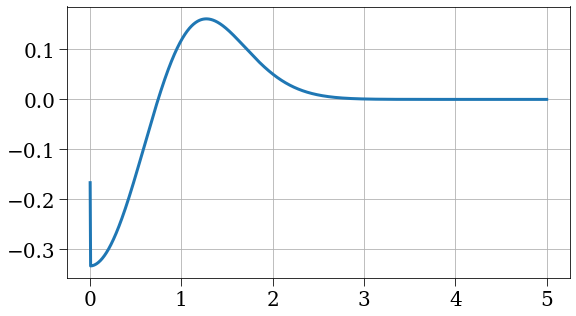

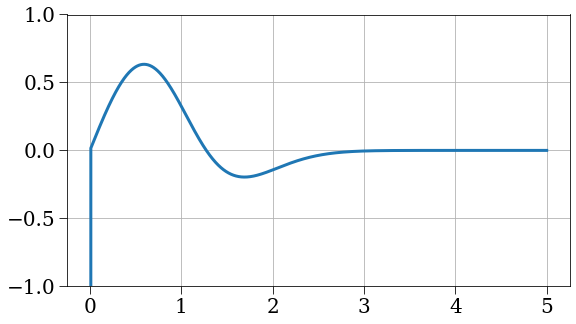

<Figure size 648x360 with 0 Axes>

In [28]:
r0 = r['r'][0,:]
rho0 = r['rho_r'][0,:]
figsize = (16, 5)
lnrho0 = np.log(rho0)
dlnrho0_dr = np.gradient(lnrho0, r0)
d2lnrho0_dr2 = np.gradient(dlnrho0_dr, r0)
d3lnrho0_dr3 = np.gradient(d2lnrho0_dr2, r0)

# dlnrho0_dr_2 = np.diff(lnrho0) / np.diff(r0)
# d2lnrho0_dr2_2 = np.diff(dlnrho0_dr_2) / np.diff(r0)
# d3lnrho0_dr3_2 = np.diff(d2lnrho0_dr2_2) / np.diff(r0)

plt.plot(r0, lnrho0)
plt.figure()
plt.plot(r0, dlnrho0_dr)
# plt.plot(r0, dlnrho0_dr_2, ls='--')
plt.figure()
plt.plot(r0, d2lnrho0_dr2)
# plt.plot(r0, d2lnrho0_dr2_2, ls='--')
plt.figure()
plt.plot(r0, d3lnrho0_dr3)
# plt.plot(r0, d3lnrho0_dr3_2, ls='--')
plt.ylim(-1, 1)
plt.figure()

In [ ]:
import numpy as np

def fd_weights(x, x0, M):
    """
    Compute finite-difference weights for derivatives up to order M
    at x0, given nodes x (length N).
    Returns an (N x (M+1)) array w where w[j, m] is weight for f^(m)(x0).
    Uses Fornberg's algorithm (1988).
    """
    N = len(x)
    w = np.zeros((N, M+1))
    c = np.zeros((N, M+1))
    c1 = 1.0
    c4 = x[0] - x0
    c[0,0] = 1.0
    for i in range(1, N):
        mn = min(i, M)
        c2 = 1.0
        c5 = c4
        c4 = x[i] - x0
        for j in range(0, i):
            c3 = x[i] - x[j]
            c2 *= c3
            if j == i-1:
                for k in range(mn, 0, -1):
                    c[i,k] = c1*(k*c[i-1,k-1] - c5*c[i-1,k]) / c2
                c[i,0] = -c1*c5*c[i-1,0] / c2
            for k in range(mn, 0, -1):
                c[j,k] = (c4*c[j,k] - k*c[j,k-1]) / c3
            c[j,0] = c4*c[j,0] / c3
        c1 = c2
    return c  # c[j, m] = weight for f^(m)(x0) from f(x[j])

def derivative_nonuniform(x, y, m=1, stencil_size=5):
    """
    Compute the m-th derivative of y at each x_i (non-uniform grid)
    using Fornberg weights on a sliding stencil of given size.
    At boundaries, uses one-sided stencils of same size.
    
    x : array of coordinates, length N
    y : array of function values f(x), length N
    m : derivative order (1,2,3,…)
    stencil_size : number of points in each stencil (>= m+1)
    """
    N = len(x)
    dy = np.zeros_like(y)
    s = stencil_size
    half = s // 2

    for i in range(N):
        # choose stencil window [i0 .. i1]
        if i < half:
            i0, i1 = 0, s
        elif i > N-1-half:
            i0, i1 = N-s-1, N-1
        else:
            i0, i1 = i-half, i+half+1
        xs = x[i0:i1+1]
        ys = y[i0:i1+1]
        # compute weights for m-th derivative at x[i]
        w = fd_weights(xs, x[i], m)
        # weights are in column m
        dy[i] = np.dot(w[:, m], ys)
    return dy


import numpy as np
import matplotlib.pyplot as plt


# compute 1st, 2nd, 3rd derivatives:
d1 = derivative_nonuniform(r0, lnrho0, m=1, stencil_size=7)
d2 = derivative_nonuniform(r0, lnrho0, m=2, stencil_size=7)
d3 = derivative_nonuniform(r0, lnrho0, m=3, stencil_size=7)

plt.figure(figsize=(12,8))
plt.subplot(3,1,1); plt.plot(r0, d1); plt.title("1st deriv")
plt.subplot(3,1,2); plt.plot(r0, d2); plt.title("2nd deriv")
plt.subplot(3,1,3); plt.plot(r0, d3); plt.title("3rd deriv")
plt.tight_layout()
plt.show()
du = derivative_nonuniform

ValueError: shapes (7,) and (8,) not aligned: 7 (dim 0) != 8 (dim 0)

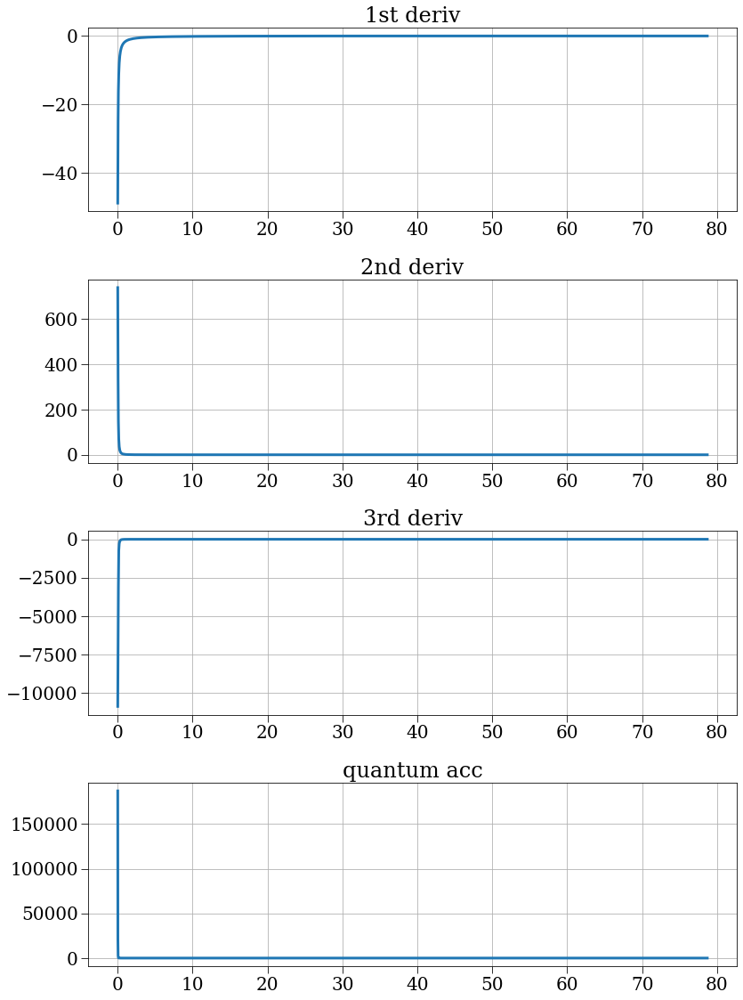

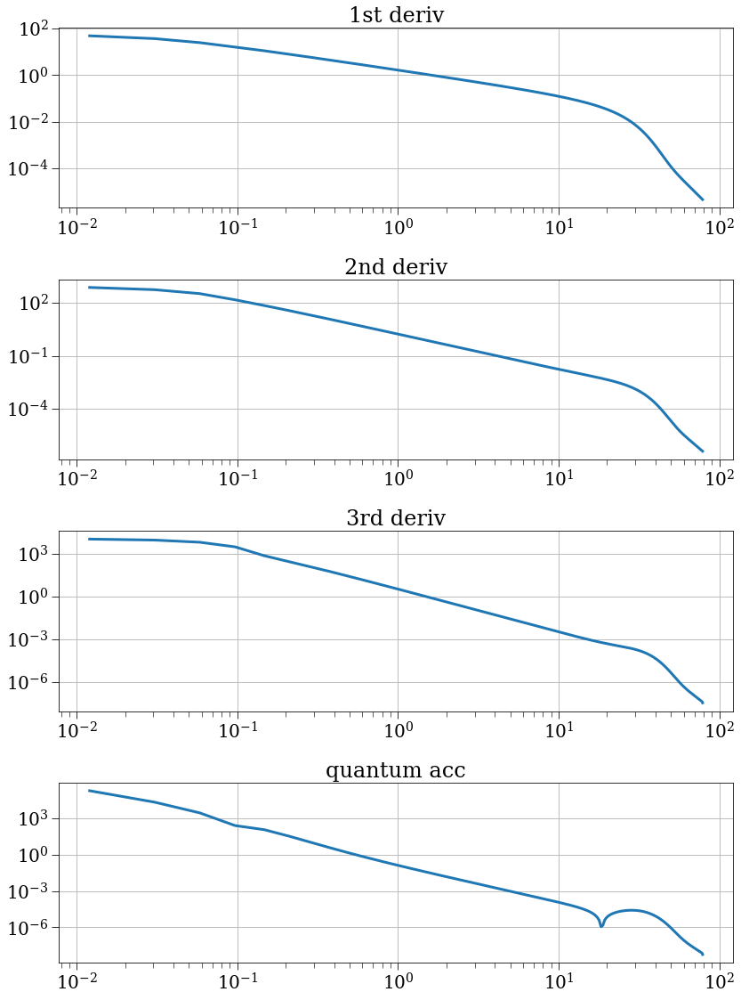

In [56]:
lnrho_fin = np.log(rho_fin)
d1 = derivative_nonuniform(r_fin, lnrho_fin, m=1, stencil_size=7)
d2 = derivative_nonuniform(r_fin, lnrho_fin, m=2, stencil_size=7)
d3 = derivative_nonuniform(r_fin, lnrho_fin, m=3, stencil_size=7)
aq = 1/4 * d3 + 1/4 * d1*d2 - 1/2 * 1/r_fin**2 * d1 + 1/2 * 1/r_fin * d2

plt.figure(figsize=(12,16))
plt.subplot(4,1,1); plt.plot(r_fin, d1); plt.title("1st deriv")
plt.subplot(4,1,2); plt.plot(r_fin, d2); plt.title("2nd deriv")
plt.subplot(4,1,3); plt.plot(r_fin, d3); plt.title("3rd deriv")
plt.subplot(4,1,4); plt.plot(r_fin, aq); plt.title("quantum acc")
plt.tight_layout()

plt.figure(figsize=(12,16))
plt.subplot(4,1,1); plt.plot(r_fin, np.abs(d1)); plt.title("1st deriv"); plt.xscale('log'); plt.yscale('log')
plt.subplot(4,1,2); plt.plot(r_fin, np.abs(d2)); plt.title("2nd deriv"); plt.xscale('log'); plt.yscale('log')
plt.subplot(4,1,3); plt.plot(r_fin, np.abs(d3)); plt.title("3rd deriv"); plt.xscale('log'); plt.yscale('log')
plt.subplot(4,1,4); plt.plot(r_fin, np.abs(aq)); plt.title("quantum acc"); plt.xscale('log'); plt.yscale('log')
plt.tight_layout()

In [34]:
np.mean(np.diff(r0))

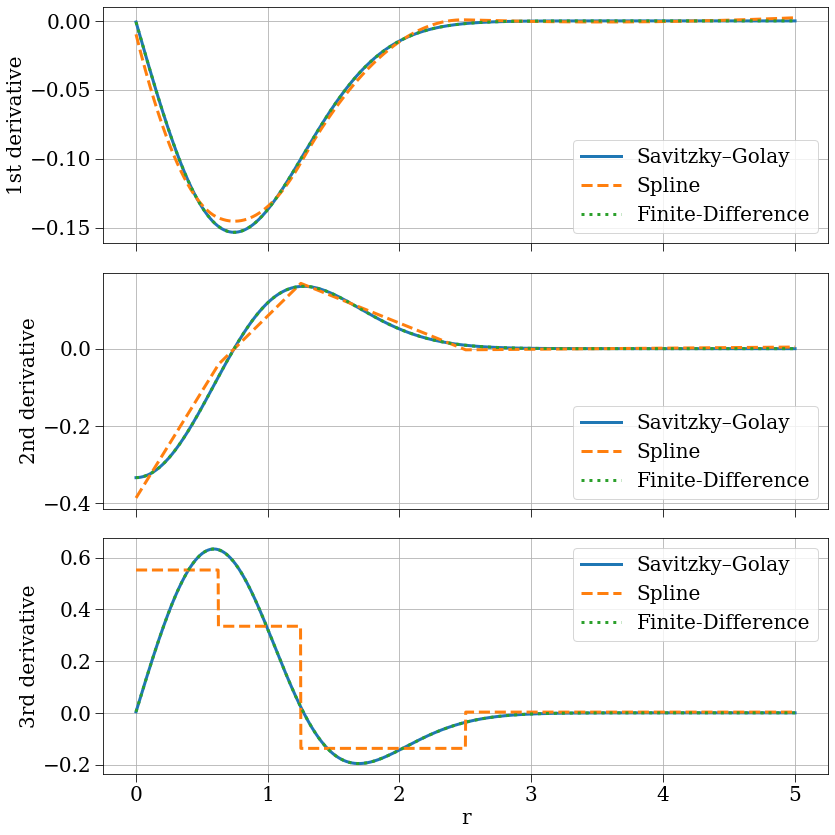

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.interpolate import UnivariateSpline
from findiff import FinDiff

r0 = r['r'][0,:]
lnrho0 = np.log(r['rho_r'][0,:])
h = np.mean(np.diff(r0))

# Savitzky–Golay
d1_sg = savgol_filter(lnrho0, 31, 5, deriv=1, delta=h)
d2_sg = savgol_filter(lnrho0, 31, 5, deriv=2, delta=h)
d3_sg = savgol_filter(lnrho0, 31, 5, deriv=3, delta=h)

# Spline
spl = UnivariateSpline(r0, lnrho0, s=1e-3)
d1_sp = spl.derivative(1)(r0)
d2_sp = spl.derivative(2)(r0)
d3_sp = spl.derivative(3)(r0)

# Finite-diff
D1 = FinDiff(0, h, 1, acc=4)
D2 = FinDiff(0, h, 2, acc=4)
D3 = FinDiff(0, h, 3, acc=4)
d1_fd = D1(lnrho0); d2_fd = D2(lnrho0); d3_fd = D3(lnrho0)

# Plot
fig, axs = plt.subplots(3,1,figsize=(12,12), sharex=True)
for ax, d_sg, d_sp, d_fd, title in zip(axs,
                                        [d1_sg,d2_sg,d3_sg],
                                        [d1_sp,d2_sp,d3_sp],
                                        [d1_fd,d2_fd,d3_fd],
                                        ["1st","2nd","3rd"]):
    ax.plot(r0, d_sg, label="Savitzky–Golay")
    ax.plot(r0, d_sp, '--', label="Spline")
    ax.plot(r0, d_fd, ':', label="Finite-Difference")
    ax.set_ylabel(f"{title} derivative")
    ax.legend()
axs[-1].set_xlabel("r")
plt.tight_layout()

In [ ]:
r0 = r['r'][0,:]
rho0 = r['rho_r'][0,:]
figsize = (16, 5)

rc0 = np.zeros(len(r0))
rc0[0] = r0[0] / 2 # first shell center is at half the first shell edge's radius
rc0[1:] = 0.5 * (r0[1:] + r0[:-1]) # all other shell centers are at the average of the neighboring shell edge radii
rhoc0 = np.interp(rc0, r0, rho0)
lnrhoc0 = np.log(rhoc0)

plt.scatter(r0, rho0)
plt.scatter(rc0, np.interp(rc0, r0, rho0))
# plt.xscale('log')
# plt.yscale('log')


# rho_r lives in the middle of shells. I want to get rho_r at the edges of the shells
# I'll linearly interpolate between the values of rho_r at the middle of the shells
for i in range(1, len(r0)-1):
    




lnrho0 = np.log(rho0)
dlnrho0_dr = np.zeros(len(r0))
d2lnrho0_dr2 = np.zeros(len(r0))
d3lnrho0_dr3 = np.zeros(len(r0))
for i in range(len(r0)):
    if i == 0:
        pass
    elif i == len(r0) - 1:
        pass
    else:
        




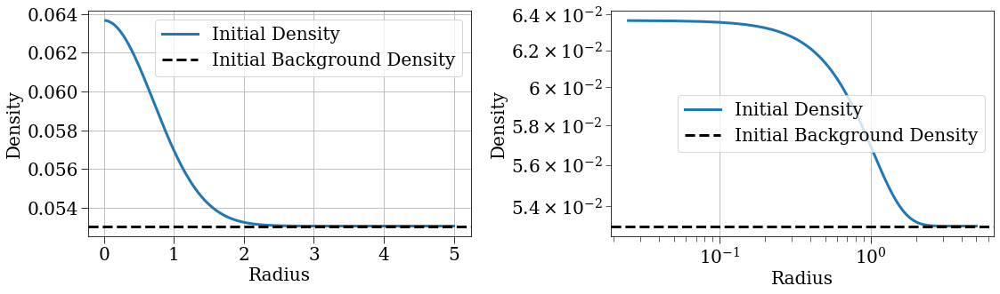

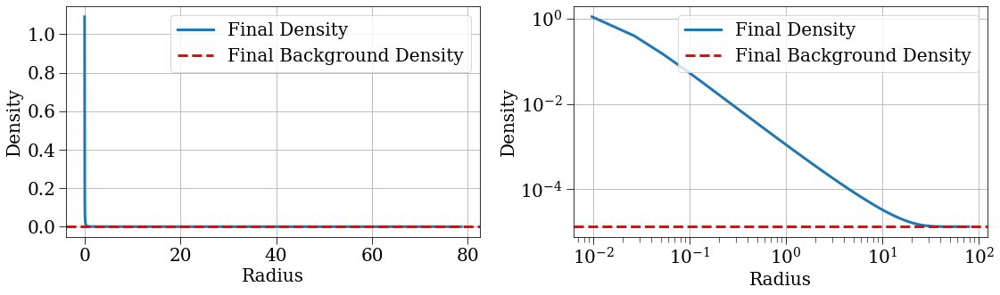

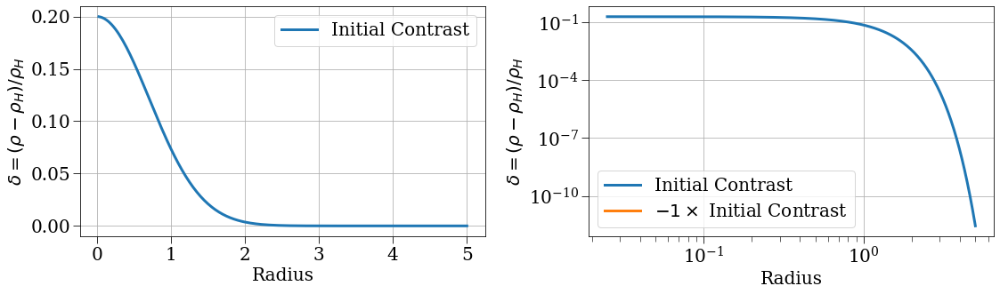

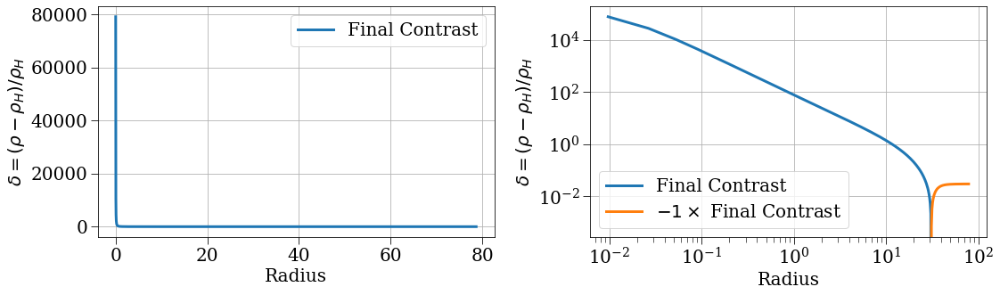

In [21]:
r0 = r['r'][0,:]
rho0 = r['rho_r'][0,:]
r_fin = r['r'][-1,:]
rho_fin = r['rho_r'][-1,:]
t_fin = r['t'][-1]
rho_H_fin = rho_H / t_fin**2
figsize = (16, 5)

# Initial density plot - linear and log scales
fig, axs = plt.subplots(1, 2, figsize=figsize)
# Linear scale
axs[0].plot(r0, rho0, label='Initial Density')
axs[0].axhline(rho_H, color='k', linestyle='--', label='Initial Background Density')
axs[0].set_xlabel('Radius')
axs[0].set_ylabel('Density')

axs[0].legend()
# Log scale
axs[1].plot(r0, rho0, label='Initial Density')
axs[1].axhline(rho_H, color='k', linestyle='--', label='Initial Background Density')
axs[1].set_xlabel('Radius')
axs[1].set_ylabel('Density')
axs[1].set_yscale('log')
axs[1].set_xscale('log')
axs[1].legend()
plt.tight_layout()

# Final density plot - linear and log scales
fig, axs = plt.subplots(1, 2, figsize=figsize)
# Linear scale
axs[0].plot(r_fin, rho_fin, label='Final Density')
axs[0].axhline(rho_H_fin, color='red', linestyle='--', label='Final Background Density')
axs[0].set_xlabel('Radius')
axs[0].set_ylabel('Density')

axs[0].legend()
# Log scale
axs[1].plot(r_fin, rho_fin, label='Final Density')
axs[1].axhline(rho_H_fin, color='red', linestyle='--', label='Final Background Density')
axs[1].set_xlabel('Radius')
axs[1].set_ylabel('Density')

axs[1].set_yscale('log')
axs[1].set_xscale('log')
axs[1].legend()
plt.tight_layout()

# Initial contrast plot - linear and log scales
fig, axs = plt.subplots(1, 2, figsize=figsize)
# Linear scale
axs[0].plot(r0, (rho0 - rho_H) / rho_H, label='Initial Contrast')
axs[0].set_xlabel('Radius')
axs[0].set_ylabel(r'$\delta=(\rho-\rho_H)/\rho_H$')

axs[0].legend()
# Log scale
axs[1].plot(r0, (rho0 - rho_H) / rho_H, label='Initial Contrast')
axs[1].plot(r0, -(rho0 - rho_H) / rho_H, label=r'$-1 \times$ Initial Contrast')
axs[1].set_xlabel('Radius')
axs[1].set_ylabel(r'$\delta=(\rho-\rho_H)/\rho_H$')

axs[1].set_yscale('log')
axs[1].set_xscale('log')
axs[1].legend()
plt.tight_layout()

# Final contrast plot - linear and log scales
fig, axs = plt.subplots(1, 2, figsize=figsize)
# Linear scale
axs[0].plot(r_fin, (rho_fin - rho_H_fin) / rho_H_fin, label='Final Contrast')
axs[0].set_xlabel('Radius')
axs[0].set_ylabel(r'$\delta=(\rho-\rho_H)/\rho_H$')

axs[0].legend()
# Log scale
axs[1].plot(r_fin, (rho_fin - rho_H_fin) / rho_H_fin, label='Final Contrast')
axs[1].plot(r_fin, -(rho_fin - rho_H_fin) / rho_H_fin, label=r'$-1 \times$ Final Contrast')
axs[1].set_xlabel('Radius')
axs[1].set_ylabel(r'$\delta=(\rho-\rho_H)/\rho_H$')

axs[1].set_yscale('log')
axs[1].set_xscale('log')
axs[1].legend()
plt.tight_layout()

In [8]:
t_max = 150_000
config_gauss = make_cycloid_config(N=200, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-2, pressure_strategy='polytrope_from_internal_energy', no_pm=False, polytropic_index=1.5, r_max=5, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=1, energy_strategy='gas3', H=H0, save_dt=1, drhodr_strategy='finite_diff', cq=4, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', )#irs='equal_mass')

2025-04-10 02:05:25,766 - collapse - INFO - Simulation setup complete


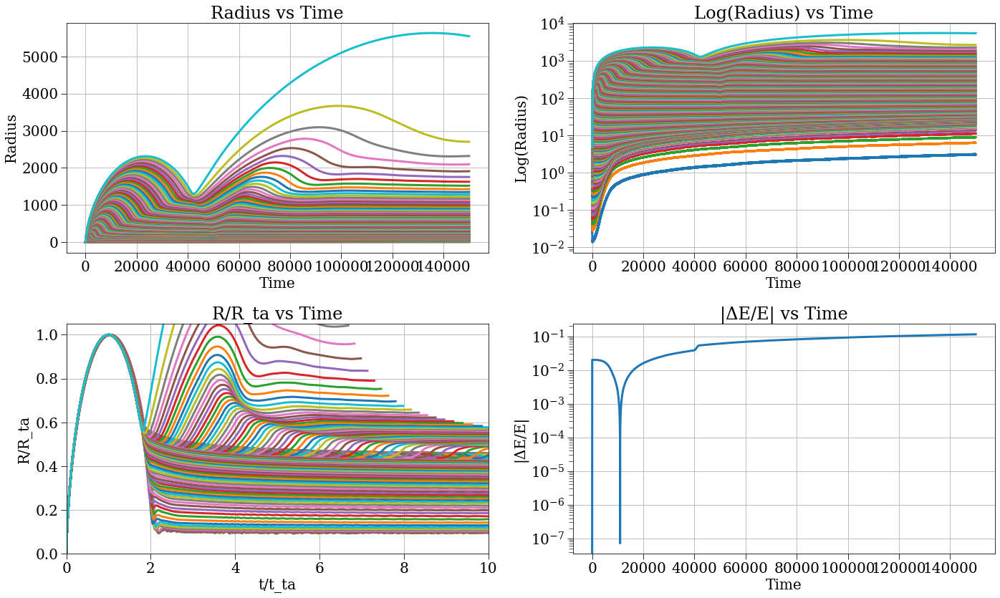

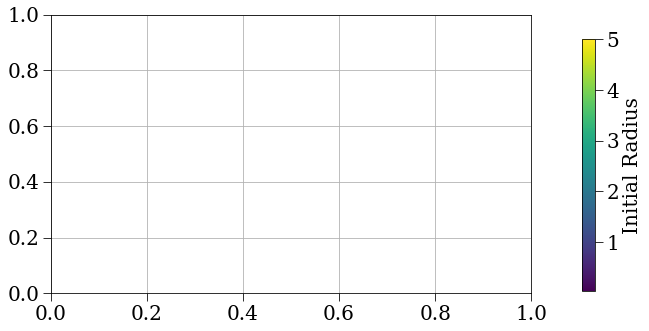

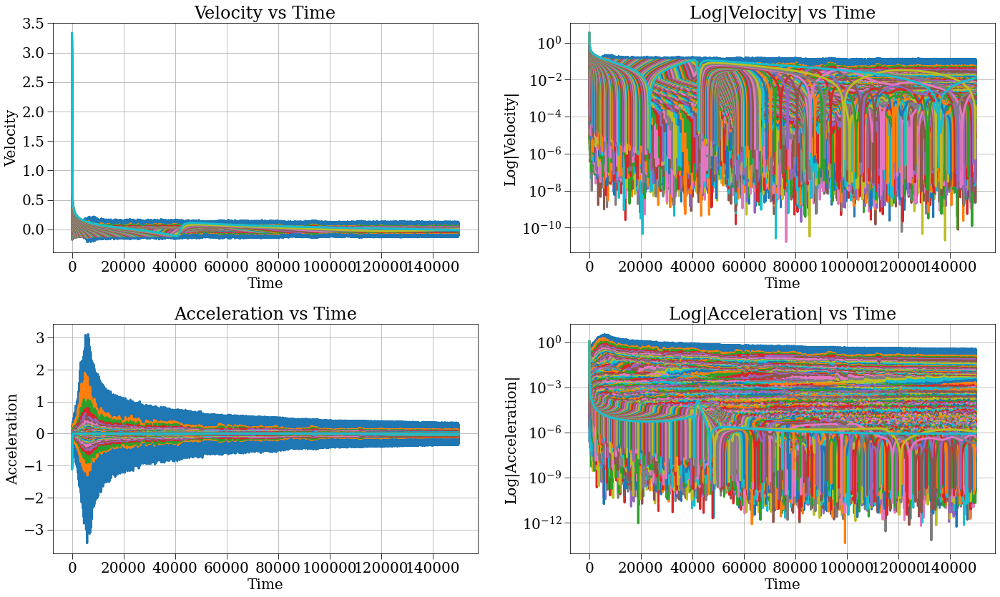

: 

: 

: 

In [9]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])
np.max(r['e_p'])

In [5]:
t_max = 150_000
config_gauss = make_cycloid_config(N=20, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-2, pressure_strategy='polytrope_from_internal_energy', no_pm=False, polytropic_index=1.5, r_max=5, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=1, energy_strategy='gas3', H=H0, save_dt=1, drhodr_strategy='finite_diff', cq=4, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', )#irs='equal_mass')

In [17]:
t_max = 40
config_gauss = make_cycloid_config(N=20, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness', dt_min=0, safety_factor=1e-4, pressure_strategy='quantum_pressure', no_pm=False, r_max=1, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=1, energy_strategy='gas3', H=H0, save_dt=1e-2, drhodr_strategy='finite_diff', cq=0, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', hbar2_over_m2=1e-3)#irs='equal_mass')

2025-04-17 10:22:51,468 - collapse - INFO - Simulation setup complete


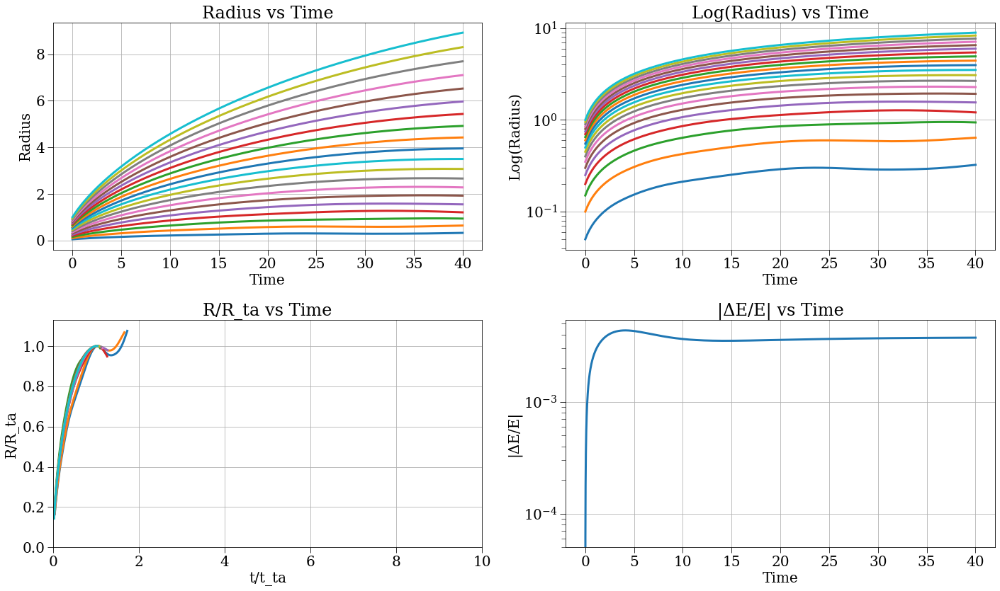

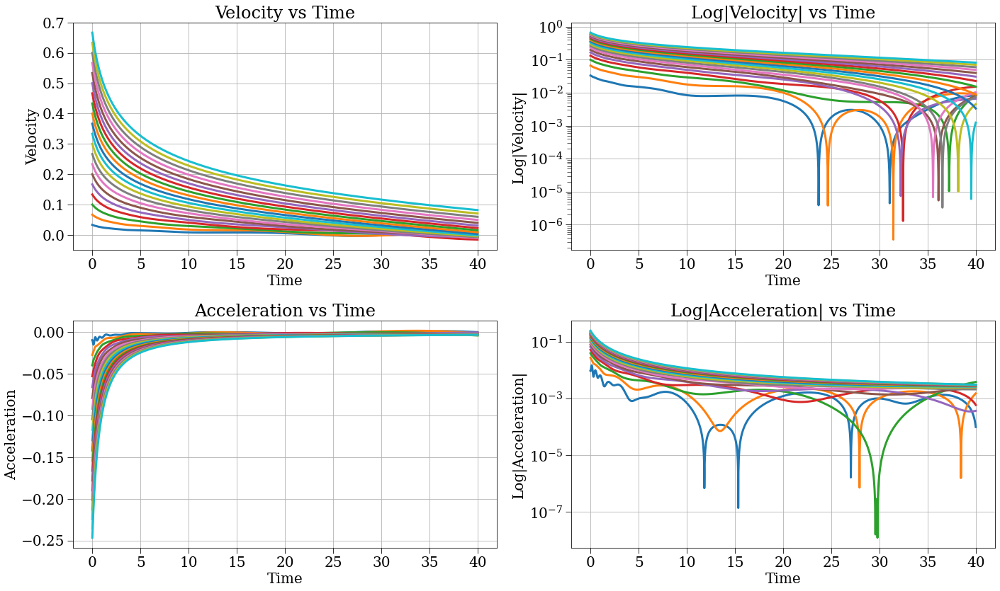

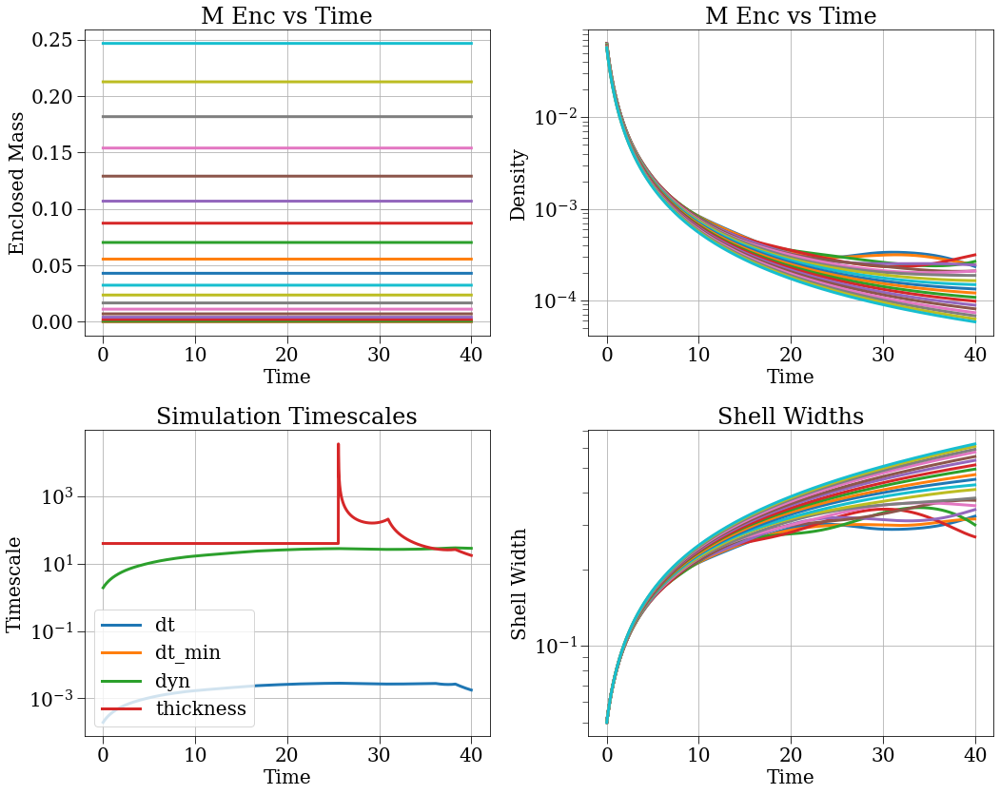

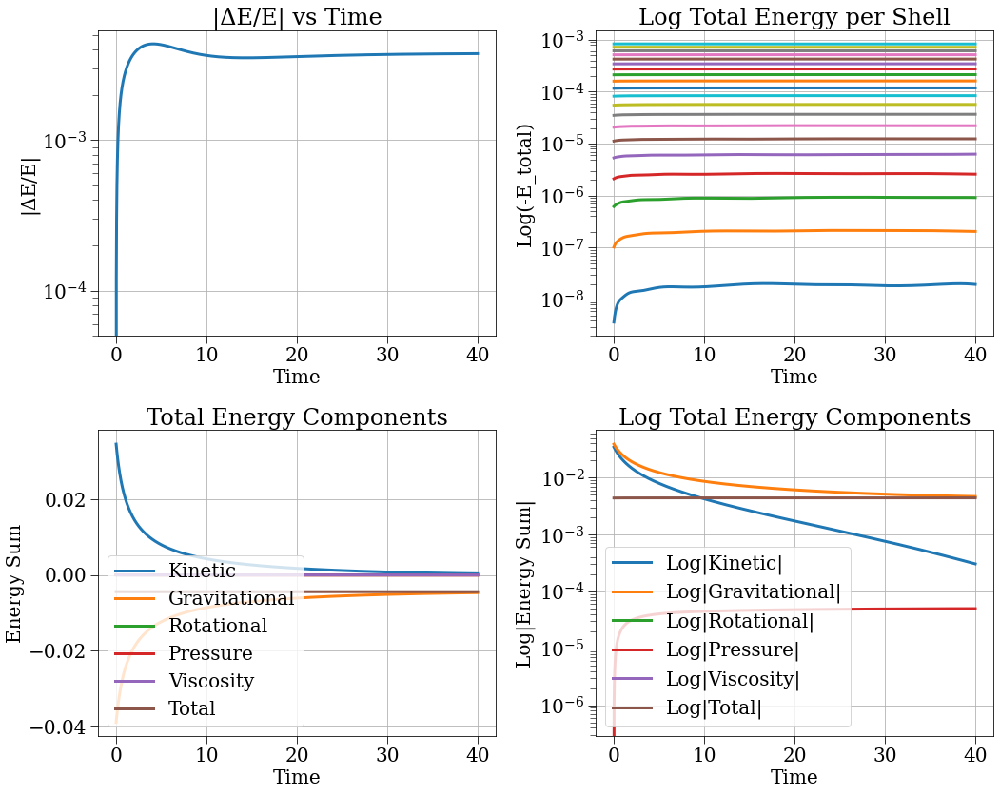

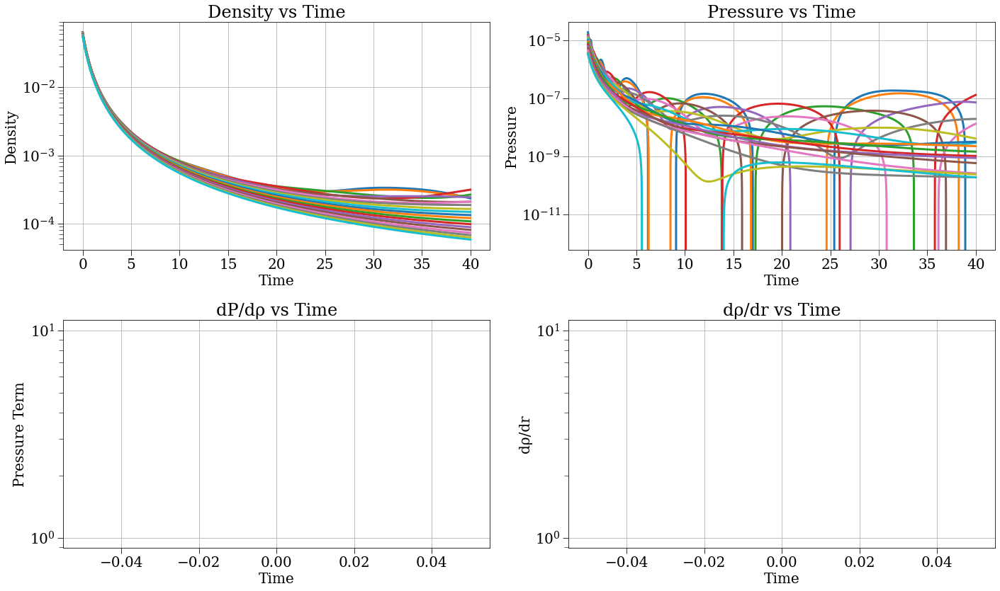

[0.05 0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7
 0.75 0.8  0.85 0.9  0.95 1.  ]


In [18]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

In [ ]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])
np.max(r['e_p'])

2025-04-10 09:52:10,181 - collapse - INFO - Simulation setup complete


In [6]:
t_max = 400_000
config_gauss = make_cycloid_config(N=20, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-2, pressure_strategy='polytrope_from_internal_energy', no_pm=False, polytropic_index=1.5, r_max=5, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=1, energy_strategy='gas3', H=H0, save_dt=1, drhodr_strategy='finite_diff', cq=4, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', )#irs='equal_mass')

2025-04-10 01:45:54,919 - collapse - INFO - Simulation setup complete


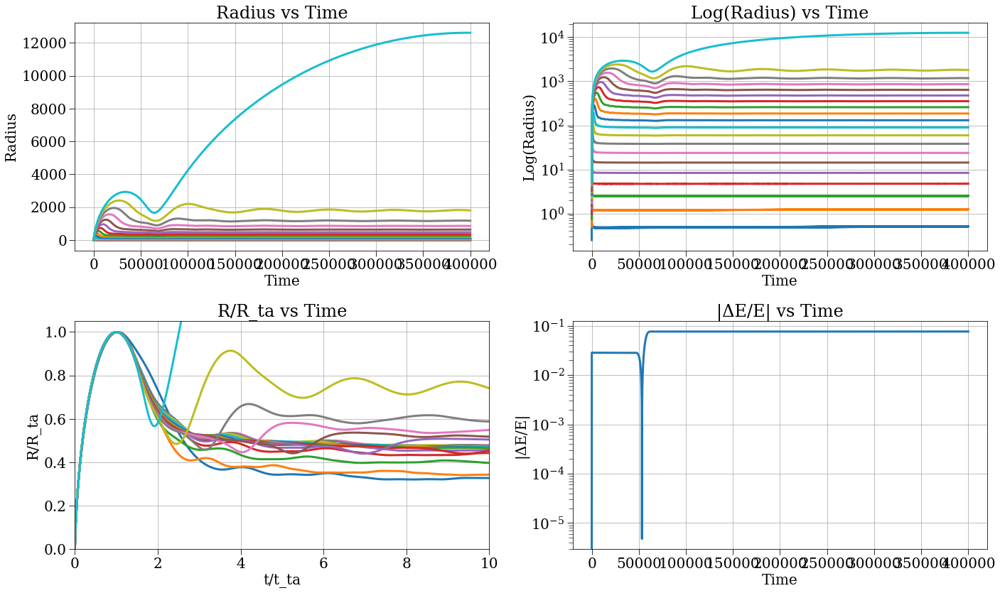

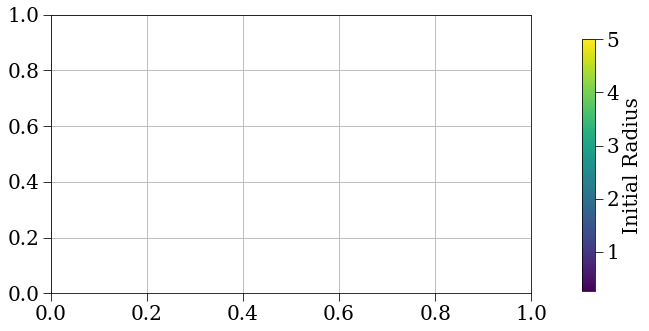

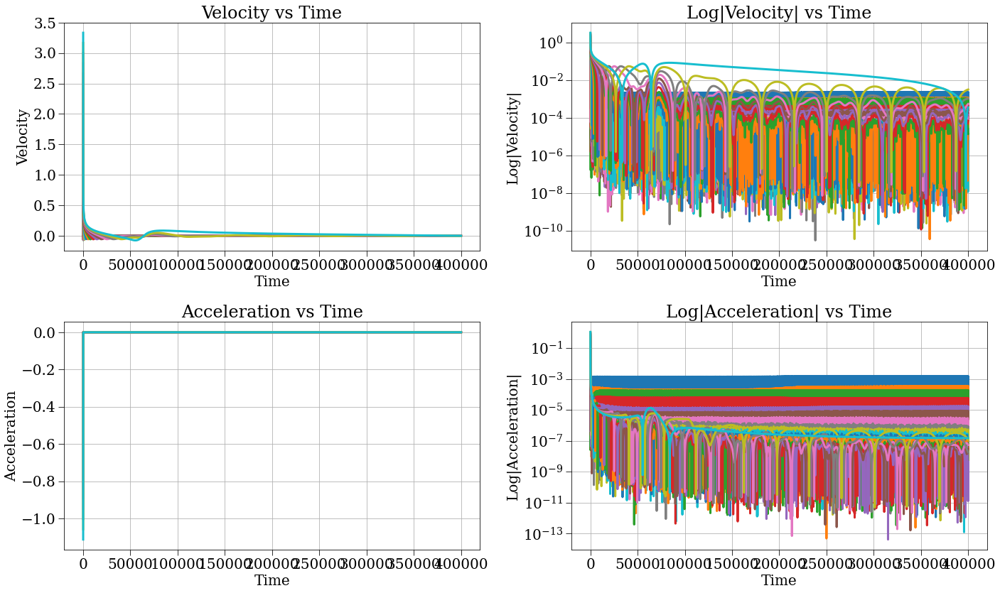

/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


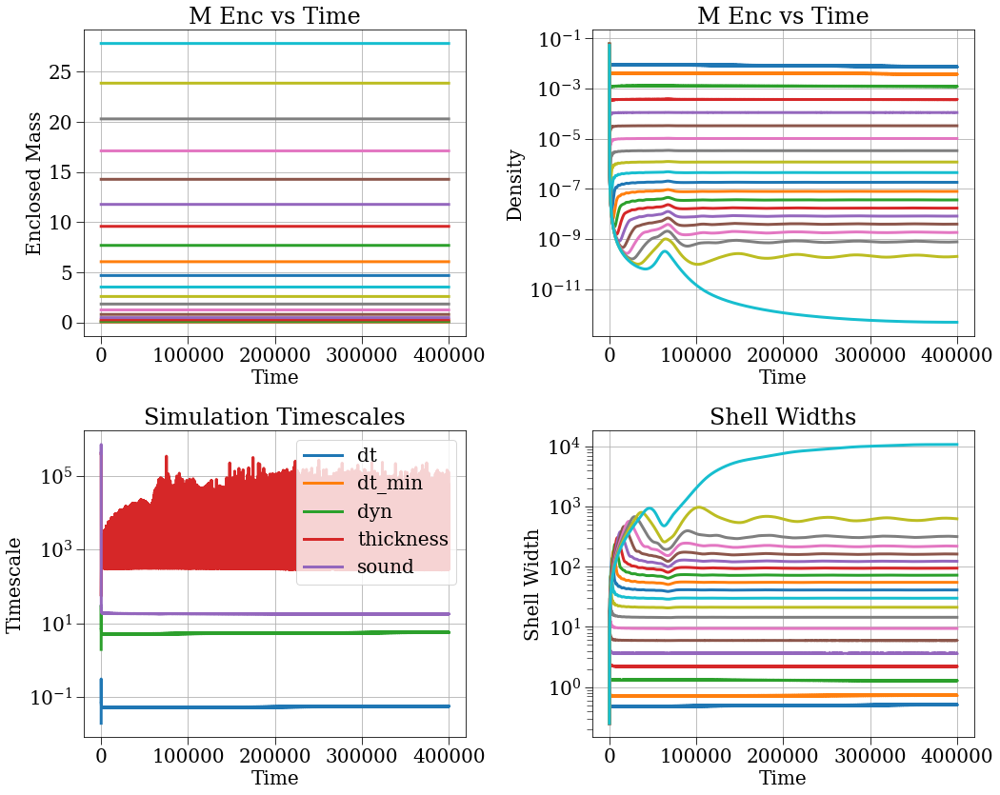

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:662: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.show()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


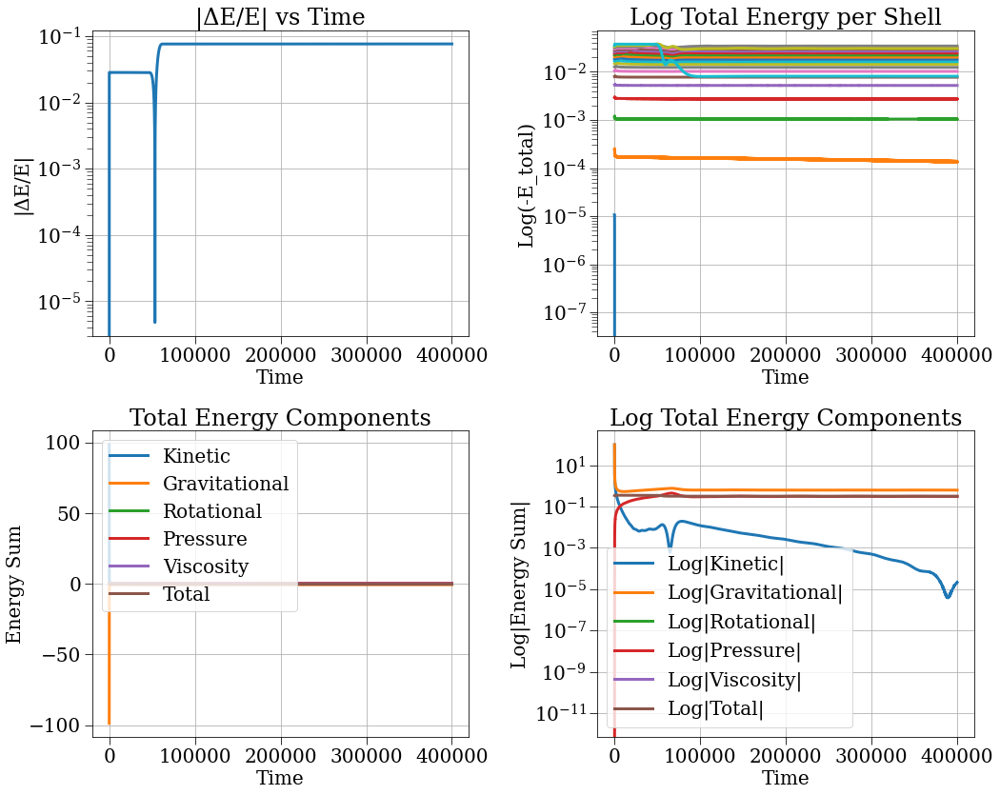

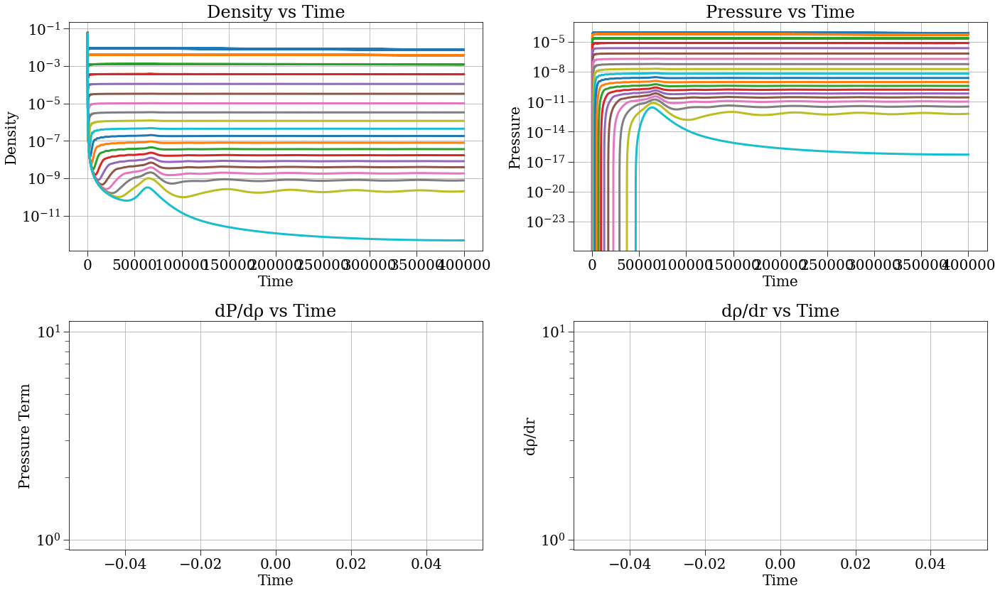

[0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5
 3.75 4.   4.25 4.5  4.75 5.  ]


0.049294562938637355

In [7]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])
np.max(r['e_p'])

In [5]:
t_max = 100
config_gauss = make_cycloid_config(N=100, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-4, pressure_strategy='polytrope_from_internal_energy', no_pm=False, polytropic_index=1.5, r_max=1, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=1, energy_strategy='gas3', H=H0, save_dt=1e-2, drhodr_strategy='finite_diff', cq=4, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', )#irs='equal_mass')

2025-04-10 00:44:57,419 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:150: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim(config.ylim)


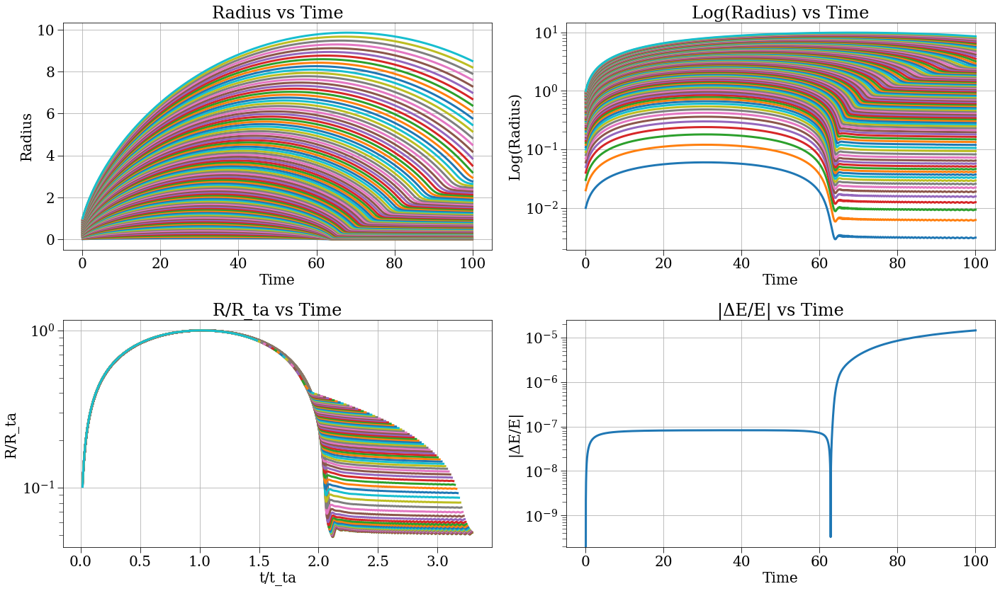

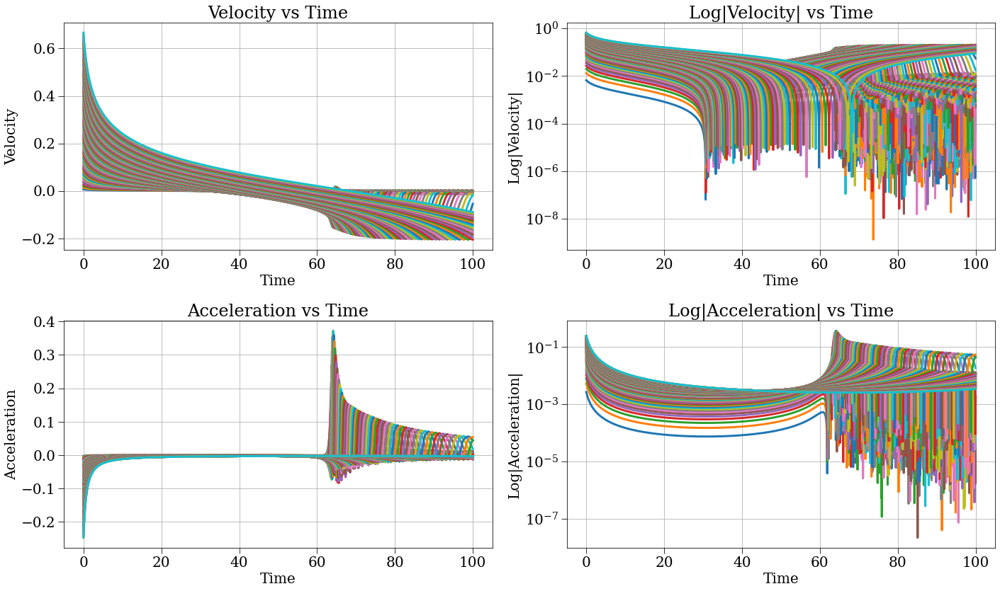

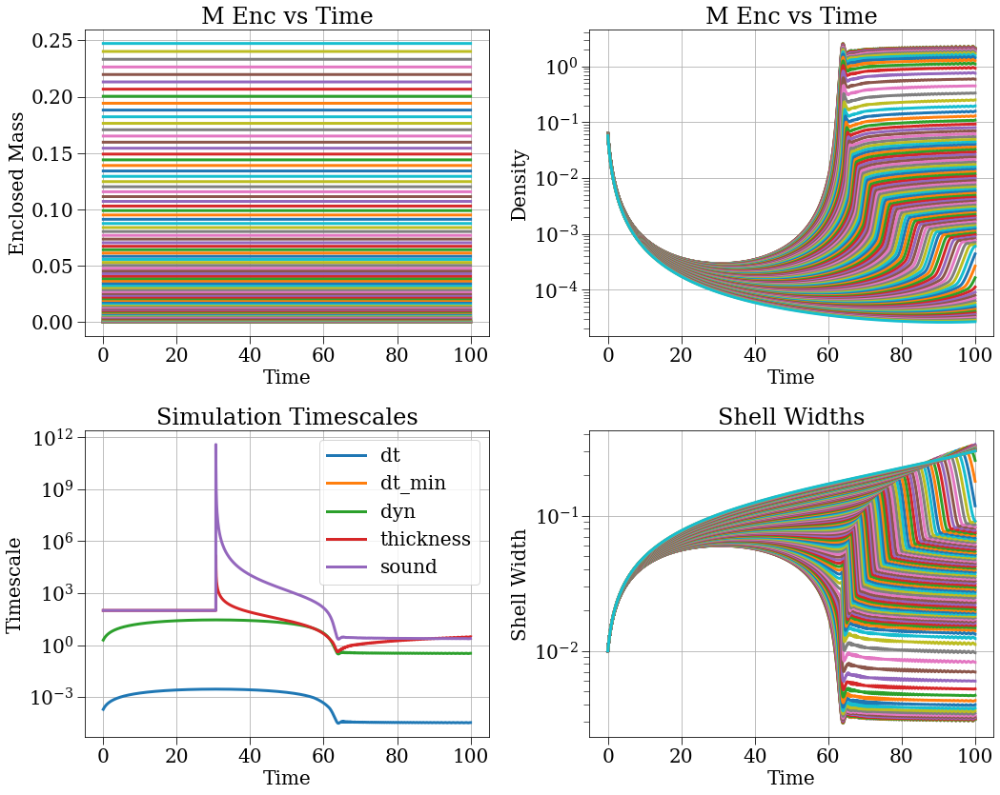

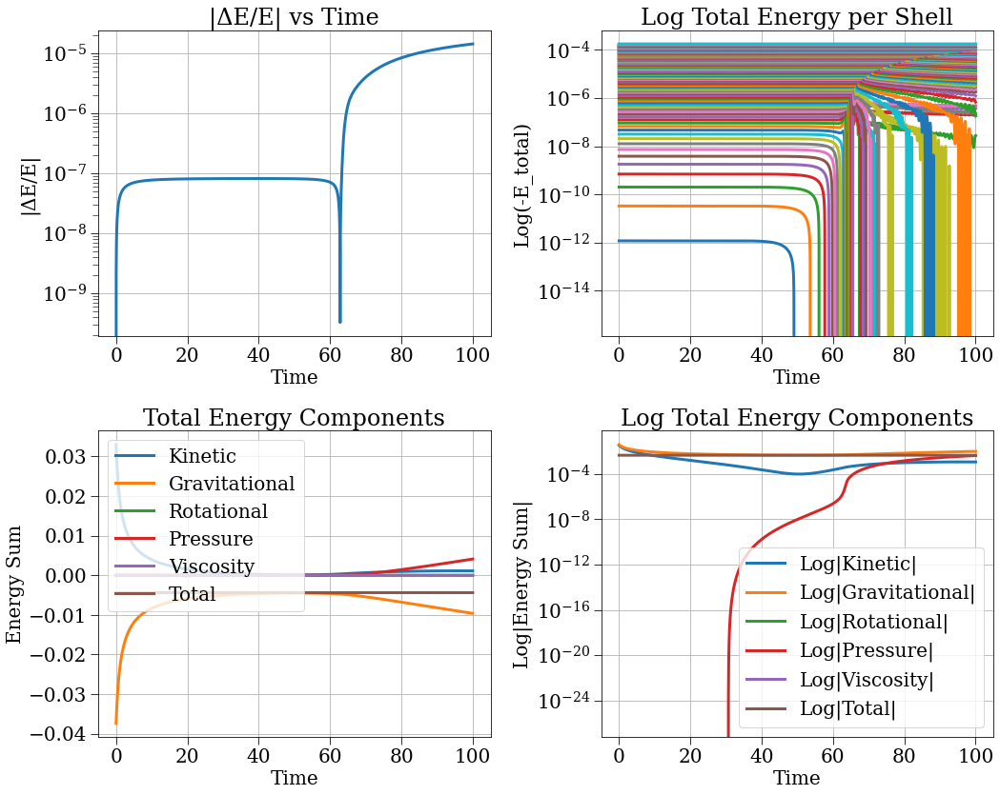

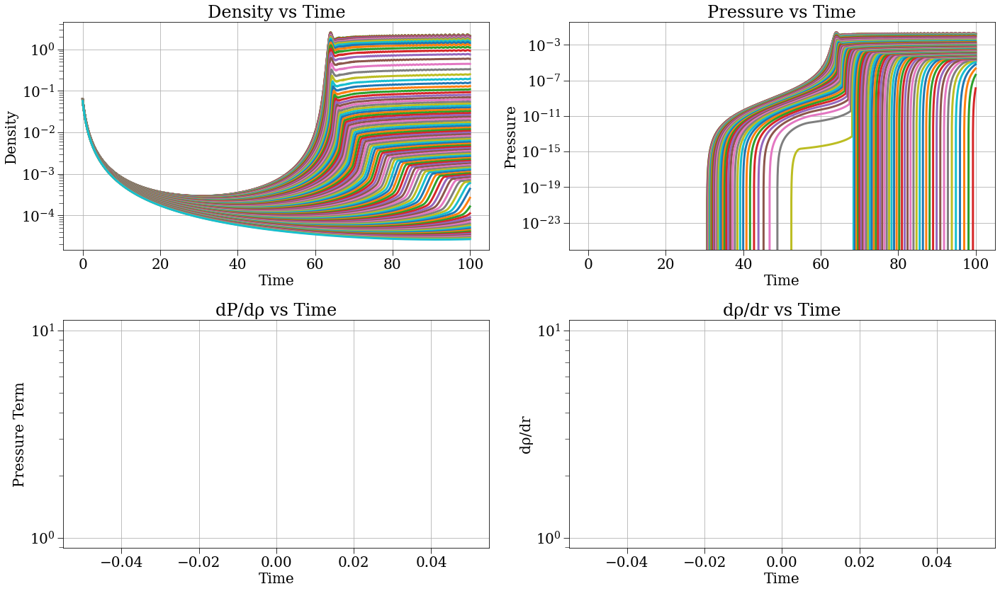

[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13 0.14
 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27 0.28
 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41 0.42
 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55 0.56
 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69 0.7
 0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83 0.84
 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95 0.96 0.97 0.98
 0.99 1.  ]


0.00012631329541128237

In [6]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])
np.max(r['e_p'])

In [10]:
s.q

AttributeError: 'SphericalCollapse' object has no attribute 'q'

In [37]:
R_i = 1
R_ta = 14.591372316921655
M = 0.23857242 #4/3 * np.pi * rho_H * R_i**3
K = 0.424 * M**(-2/3) * R_ta * 0.5
print(K)

8.04177361035835


In [3]:
t_max = 100
config_gauss = make_cycloid_config(N=10, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-2, pressure_strategy='polytrope_from_internal_energy', no_pm=False, polytropic_coef=1, r_max=2, accel_strategy='gas_vis_dis_fourpi', delta_i=0.2, r_th=0.5, energy_strategy='gas3', H=H0, save_dt=1e-2, drhodr_strategy='finite_diff', cq=4, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', irs='equal_mass')

In [5]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

2025-04-08 19:26:34,562 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [38]:
t_max =100
config_gauss = make_cycloid_config(N=150, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-4, pressure_strategy='polytrope', no_pm=False, polytropic_index=1.5, polytropic_coef=1, r_max=2, accel_strategy='gas_vis_dis_fourpi', delta_i=10, r_th=0.5, energy_strategy='gas', H=H0, save_dt=1e-2, drhodr_strategy='finite_diff', cq=10, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', irs='equal_mass')

2025-04-07 17:06:57,990 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_

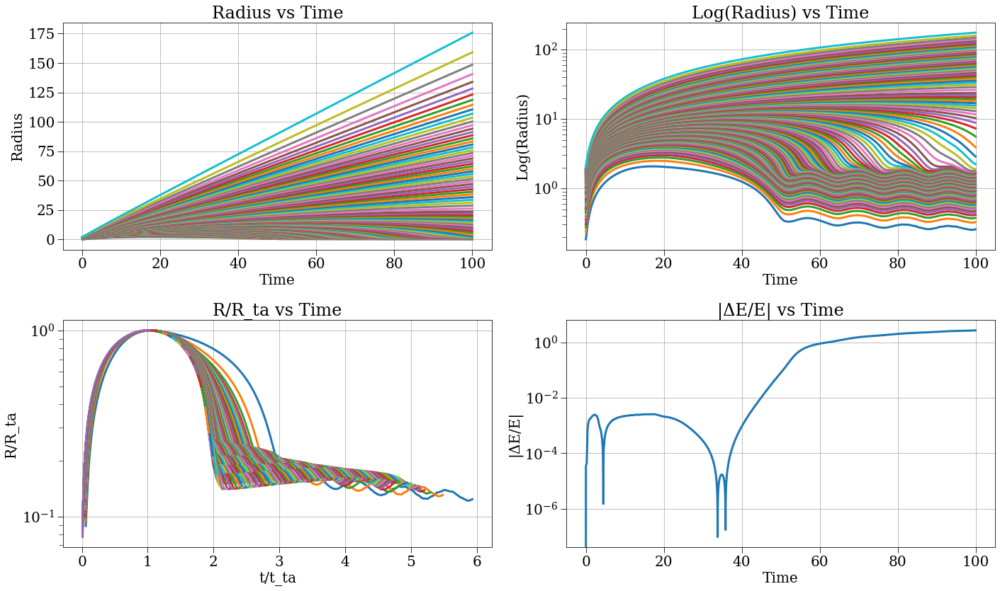

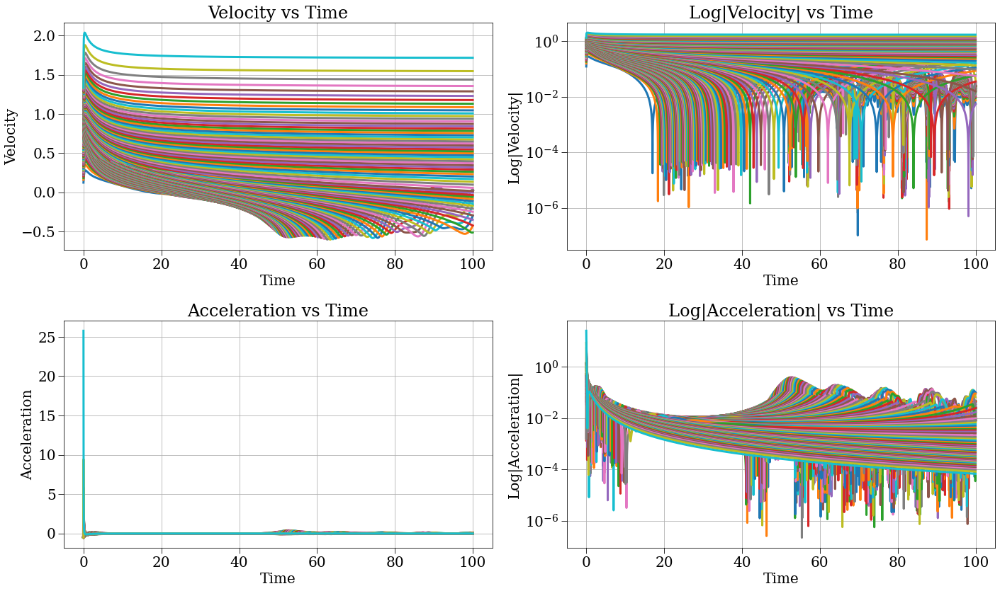

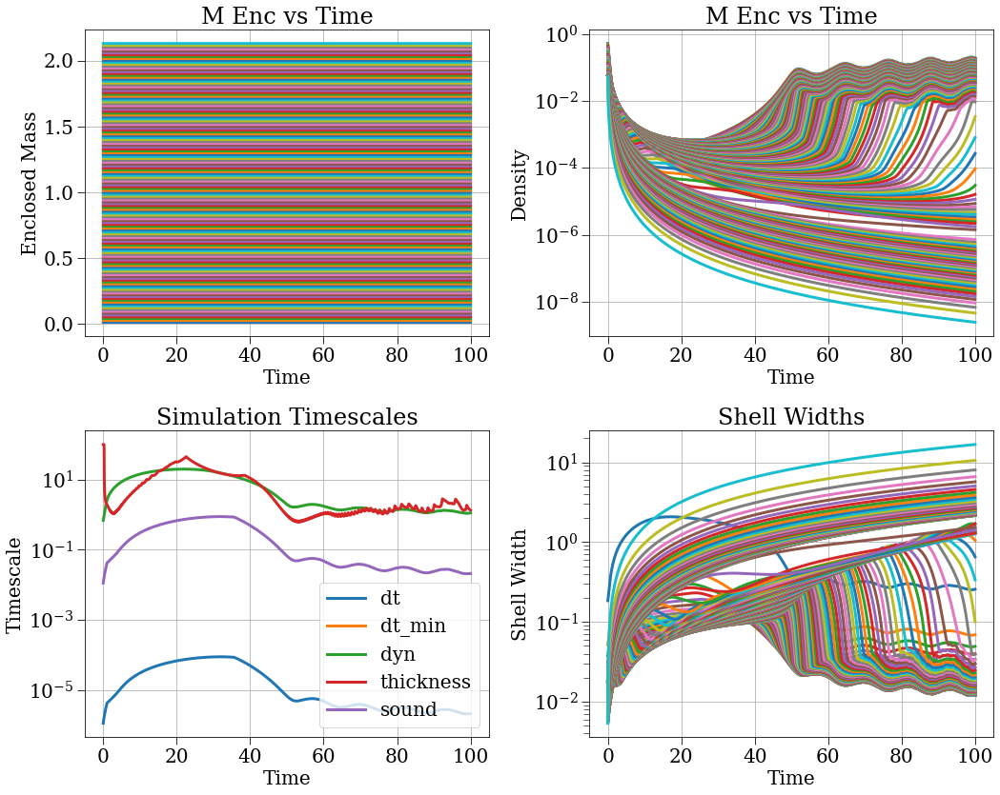

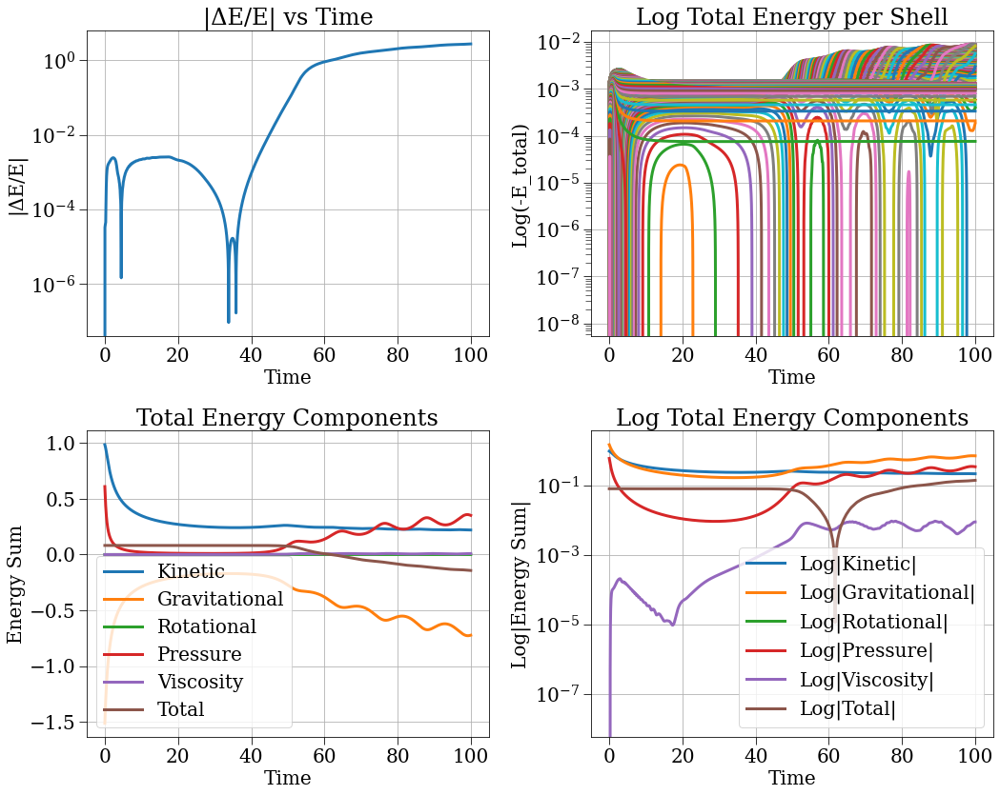

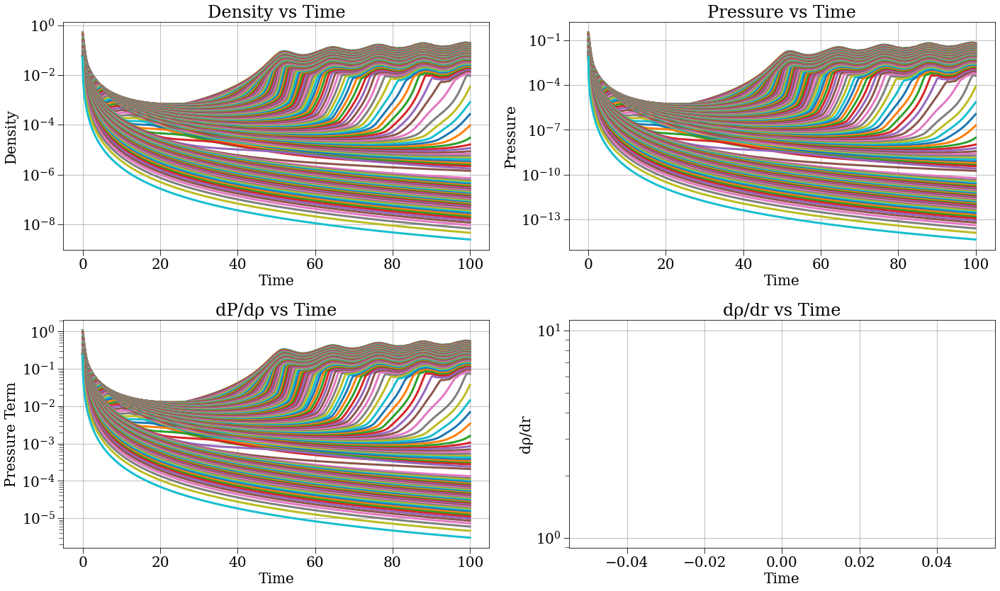

[0.18471766 0.23632188 0.27417716 0.3055561  0.33308655 0.35805682
 0.38120776 0.40301083 0.42378806 0.44377148 0.46313542 0.48201536
 0.50051963 0.51873694 0.53674139 0.55459587 0.57235451 0.59006427
 0.60776613 0.62549581 0.64328423 0.66115777 0.67913826 0.69724287
 0.71548392 0.73386851 0.75239825 0.77106897 0.78987048 0.80878658
 0.82779526 0.84686911 0.8659761  0.88508059 0.90414454 0.92312887
 0.94199484 0.96070536 0.97922607 0.99752622 1.01557923 1.033363
 1.05085998 1.06805693 1.08494469 1.10151768 1.11777353 1.13371252
 1.14933715 1.16465173 1.17966197 1.19437465 1.20879732 1.2229381
 1.23680544 1.25040799 1.26375444 1.27685347 1.2897136  1.30234321
 1.31475046 1.32694324 1.33892918 1.35071565 1.36230971 1.37371814
 1.38494744 1.39600381 1.40689321 1.4176213  1.42819352 1.43861503
 1.44889079 1.4590255  1.46902368 1.47888962 1.48862744 1.49824105
 1.50773421 1.51711049 1.52637334 1.53552603 1.54457169 1.55351333
 1.56235383 1.57109595 1.57974234 1.58829553 1.59675795 1.6051319

In [39]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

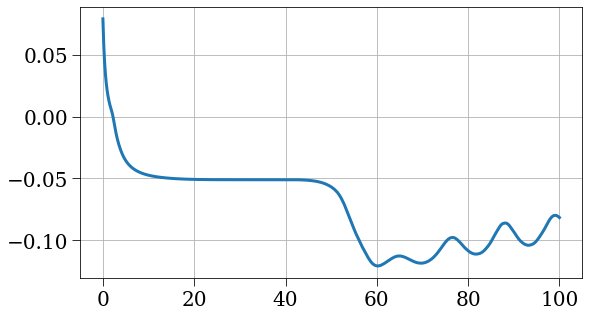

In [37]:
t = r['t']
plt.plot(t, np.sum(r['e_tot'][:,:60], axis=1))


2025-04-07 03:27:16,711 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_

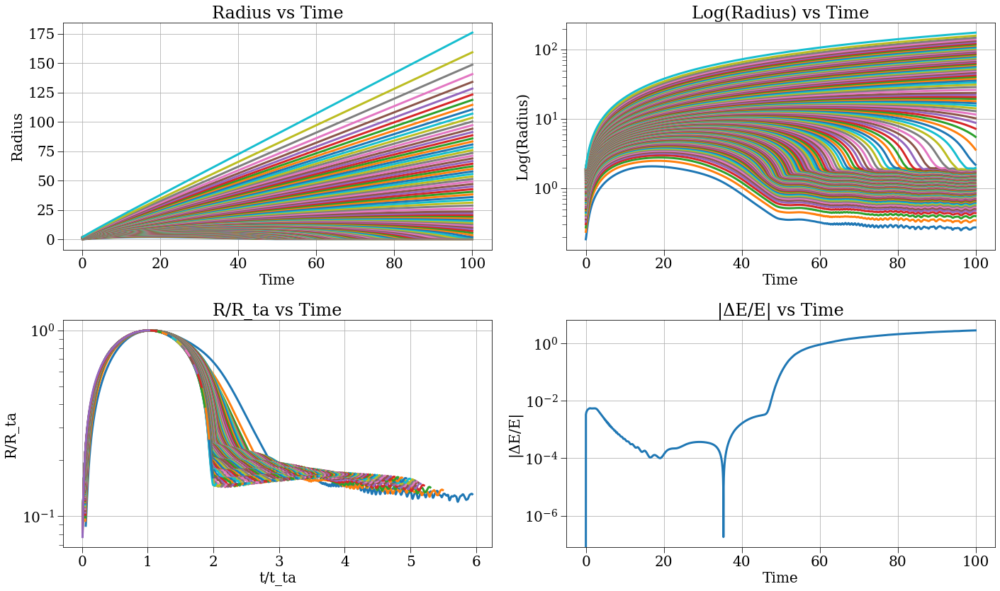

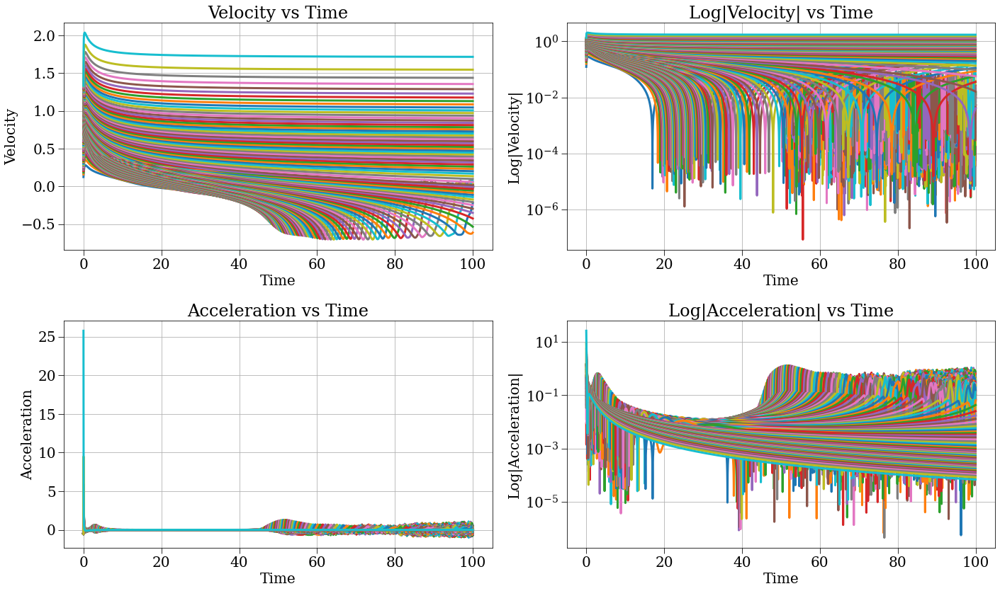

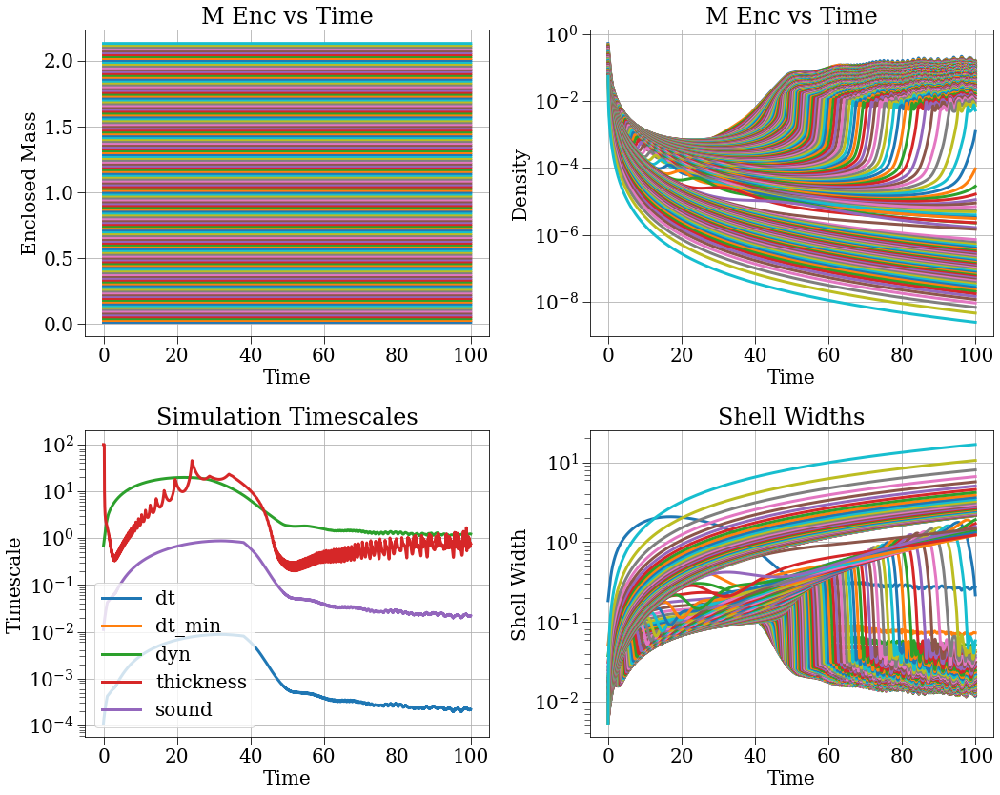

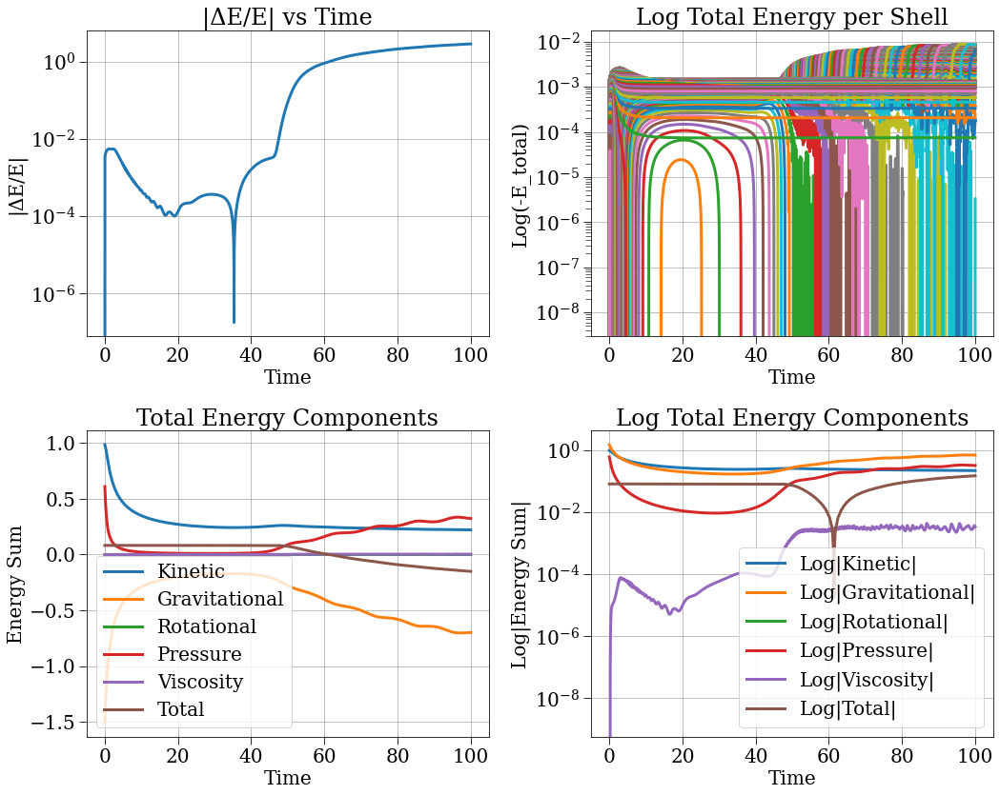

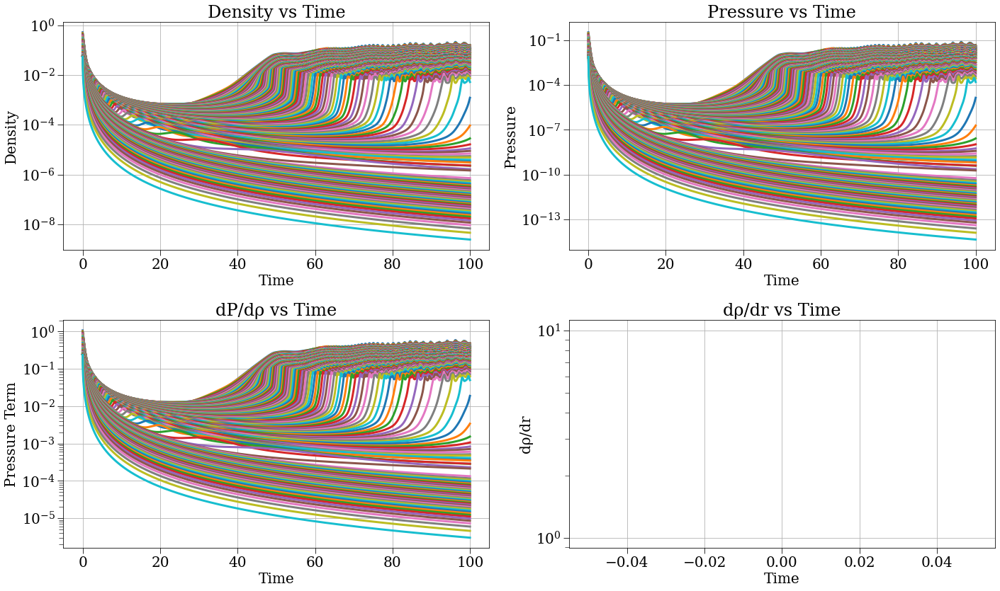

[0.18471766 0.23632188 0.27417716 0.3055561  0.33308655 0.35805682
 0.38120776 0.40301083 0.42378806 0.44377148 0.46313542 0.48201536
 0.50051963 0.51873694 0.53674139 0.55459587 0.57235451 0.59006427
 0.60776613 0.62549581 0.64328423 0.66115777 0.67913826 0.69724287
 0.71548392 0.73386851 0.75239825 0.77106897 0.78987048 0.80878658
 0.82779526 0.84686911 0.8659761  0.88508059 0.90414454 0.92312887
 0.94199484 0.96070536 0.97922607 0.99752622 1.01557923 1.033363
 1.05085998 1.06805693 1.08494469 1.10151768 1.11777353 1.13371252
 1.14933715 1.16465173 1.17966197 1.19437465 1.20879732 1.2229381
 1.23680544 1.25040799 1.26375444 1.27685347 1.2897136  1.30234321
 1.31475046 1.32694324 1.33892918 1.35071565 1.36230971 1.37371814
 1.38494744 1.39600381 1.40689321 1.4176213  1.42819352 1.43861503
 1.44889079 1.4590255  1.46902368 1.47888962 1.48862744 1.49824105
 1.50773421 1.51711049 1.52637334 1.53552603 1.54457169 1.55351333
 1.56235383 1.57109595 1.57974234 1.58829553 1.59675795 1.6051319

In [76]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

In [11]:
t_max = 500
config_gauss = make_cycloid_config(N=200, reflect_bool=True, t_max=t_max, r_min=0, timescale_strategy='dyn_thickness_sound', dt_min=0, safety_factor=1e-2, pressure_strategy='polytrope', no_pm=False, polytropic_index=1.5, polytropic_coef=0.05, r_max=np.pi/2, accel_strategy='gas_vis_dis_fourpi', delta_i=1, r_th=0.5, energy_strategy='gas', H=H0, save_dt=1e-2, drhodr_strategy='finite_diff', cq=1, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_sinc', irs='equal_mass')

2025-04-03 03:06:29,320 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_shell = (self.time + 1) / t_ta_val
/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:91: RuntimeWarning: divide by zero encountered in true_divide
  x_data_

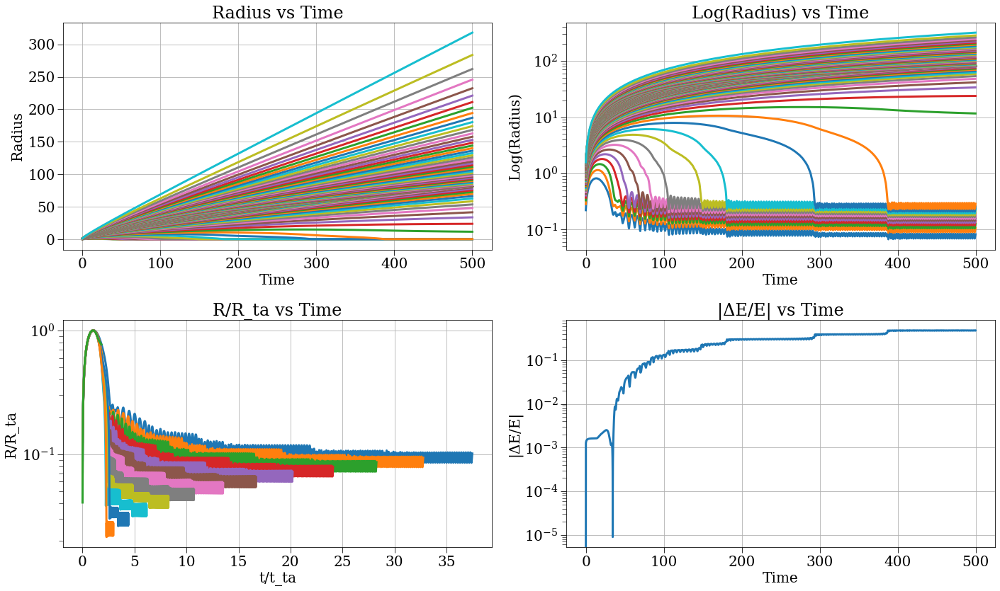

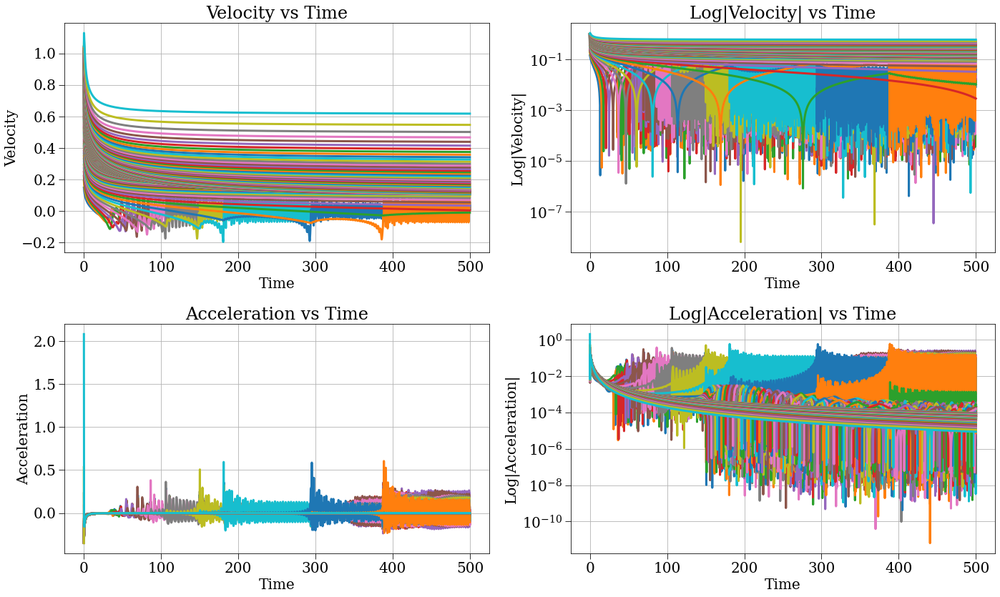

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 49486 and the array at index 1 has size 200

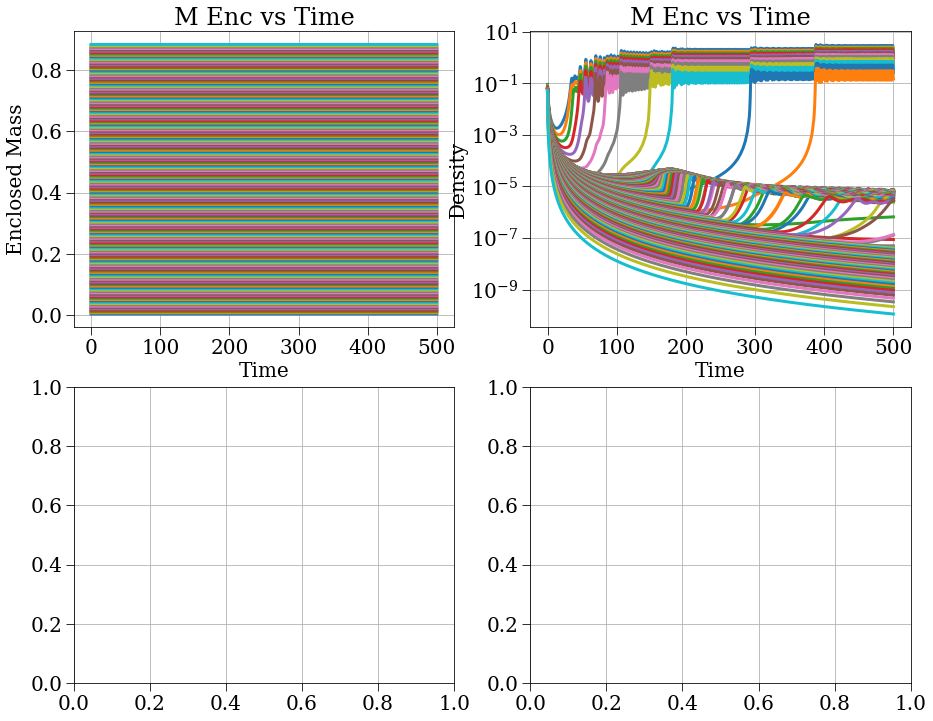

In [12]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])